# Analysis of NanoString Data for NS_CancerPath_C2535

Author: Moshe Silverstein  
Date: June 2018

The nCounter PanCancer panel includes 770 genes from 13 canonical pathways and selected reference genes.  

The following is an analysis of data collected using NanoString technology with the nCounter PanCancer panel for the following samples:   

GBM 164 Parental   
GBM 164 10uM TMZ Resistant  
GBM 164 TMZ sensitive 2days  
GBM 164 TMZ sensitive 6days  

collected in January of 2018  

and   

GBM 164 Parental  
GBM 164 5uM TMZ Resistant  
GBM164 100nM AGI5198  
GBM164 5uM TMZ R +AGI 100nM  

collected in May of 2018

each sample was collected in triplicate.  

The data is normalized both for platform and sample using the included positive controls and housekeeping genes respectively. The data is than log2 transformed. 

Both a 2D, as well as, 3D PCA plots are then generated to view the data.  

A heatmap to view the clustering of the data is then generated using [Clustergrammer](http://amp.pharm.mssm.edu/clustergrammer/).  

The reminder of the genome is then inputed using data from [ARCH4](https://amp.pharm.mssm.edu/archs4/), which is then normalized to Reads Per Million (RPM) and log2 transformed. The imputation procedure involves finding a subset of samples with similar gene expression by person correlation for each sample in the NanoString data, and then using a fully connected artificial neural network to impute the remaining gene values.  

The data is then quantile normalized across samples and z-scored across genes.  

Outlier re-normalization is then performed in order to account for extreme values generated by the imputation. Values that lie beyond five standard deviations of the mean of the normalized sample are seen as improperly imputed data and are therefore are set to the sample mean.     

Once again both a 2D, as well as, 3D PCA plots are then generated to view the data.  

A new heatmap is generated to view the clustering of the completed data (original plus imputed) using [Clustergrammer](http://amp.pharm.mssm.edu/clustergrammer/).  

Finally enrichment analysis is done by generating eirched terms for both the up regulated and down regulated genes (as measured by taking genes which fall beyond two std within the normalized data, note that the gene distribution appears to be bimodal before normalization) using [Enricher](http://amp.pharm.mssm.edu/Enrichr/).   

# Import Libraries

In [1]:
import numpy as np
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import scipy.stats as stats
import sys, os
from time import sleep
%matplotlib inline
import requests
from IPython.display import HTML

In [263]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from scipy.stats.stats import pearsonr

# Importing Keras Sequential Model
from keras.models import Sequential
from keras.layers import Dense, Dropout
import numpy
import random
from operator import add, sub

In [3]:
import seaborn as sns
sns.set(color_codes=True)
np.random.seed(sum(map(ord, "distributions")))

In [4]:
import RNAseq

In [5]:
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Load Data

#### January 2018 Data

In [6]:
df_jan_2018 = pd.read_excel('Input/20180124_207783730719_Combined_Jan 2018.xlsx', skiprows=24)

In [7]:
df_jan_2018.columns

Index(['Unnamed: 0', 'Unnamed: 1', 'Unnamed: 2', 'GBM 164 Parental',
       'Unnamed: 4', 'Unnamed: 5', 'GBM 164 10uM TMZ Resistant', 'Unnamed: 7',
       'Unnamed: 8', 'GBM 164 TMZ sensitive 2days', 'Unnamed: 10',
       'Unnamed: 11', 'GBM 164 TMZ sensitive 6days', 'Unnamed: 13',
       'Unnamed: 14'],
      dtype='object')

In [8]:
df_jan_2018.columns[[3, 6, 9, 12]]

Index(['GBM 164 Parental', 'GBM 164 10uM TMZ Resistant',
       'GBM 164 TMZ sensitive 2days', 'GBM 164 TMZ sensitive 6days'],
      dtype='object')

In [9]:
df_jan_2018.iloc[0, 3:].values

array(['Parental A', 'Parental B', 'Parental C', 'R A', 'R B', 'R C',
       'S 2 A', 'S 2 B', 'S 2 C', 'S 6 A', 'S 6 B', 'S 6 C'], dtype=object)

In [10]:
list(zip(df_jan_2018.columns[[3, 3, 3, 6, 6, 6, 6, 9, 9, 9, 12, 12, 12]], df_jan_2018.iloc[0, 3:].values))

[('GBM 164 Parental', 'Parental A'),
 ('GBM 164 Parental', 'Parental B'),
 ('GBM 164 Parental', 'Parental C'),
 ('GBM 164 10uM TMZ Resistant', 'R A'),
 ('GBM 164 10uM TMZ Resistant', 'R B'),
 ('GBM 164 10uM TMZ Resistant', 'R C'),
 ('GBM 164 10uM TMZ Resistant', 'S 2 A'),
 ('GBM 164 TMZ sensitive 2days', 'S 2 B'),
 ('GBM 164 TMZ sensitive 2days', 'S 2 C'),
 ('GBM 164 TMZ sensitive 2days', 'S 6 A'),
 ('GBM 164 TMZ sensitive 6days', 'S 6 B'),
 ('GBM 164 TMZ sensitive 6days', 'S 6 C')]

In [11]:
columns = list(zip(df_jan_2018.columns[[3, 3, 3, 6, 6, 6, 6, 9, 9, 9, 12, 12, 12]], df_jan_2018.iloc[0, 3:].values))

In [12]:
columns.insert(0, 'Accession')

In [13]:
columns.insert(0, 'GeneSymbol')

In [14]:
columns.insert(0, 'CodeClass')

In [15]:
columns

['CodeClass',
 'GeneSymbol',
 'Accession',
 ('GBM 164 Parental', 'Parental A'),
 ('GBM 164 Parental', 'Parental B'),
 ('GBM 164 Parental', 'Parental C'),
 ('GBM 164 10uM TMZ Resistant', 'R A'),
 ('GBM 164 10uM TMZ Resistant', 'R B'),
 ('GBM 164 10uM TMZ Resistant', 'R C'),
 ('GBM 164 10uM TMZ Resistant', 'S 2 A'),
 ('GBM 164 TMZ sensitive 2days', 'S 2 B'),
 ('GBM 164 TMZ sensitive 2days', 'S 2 C'),
 ('GBM 164 TMZ sensitive 2days', 'S 6 A'),
 ('GBM 164 TMZ sensitive 6days', 'S 6 B'),
 ('GBM 164 TMZ sensitive 6days', 'S 6 C')]

In [16]:
df_jan_2018.columns = columns

In [17]:
df_jan_2018.drop(df_jan_2018.index[0], axis=0, inplace=True)

In [18]:
df_jan_2018.drop(df_jan_2018.index[0], axis=0, inplace=True)

In [19]:
df_jan_2018.drop('Accession', axis=1, inplace=True)

In [20]:
df_jan_2018.set_index('GeneSymbol', inplace=True)

In [21]:
df_jan_2018.head()

,CodeClass,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)","(GBM 164 TMZ sensitive 6days, S 6 B)","(GBM 164 TMZ sensitive 6days, S 6 C)"
GeneSymbol,,,,,,,,,,,,,
CALML3,Endogenous,10,15,5,10,9,9,14,11,7,8,7,13
PIK3R2,Endogenous,1508,2109,1624,2624,2322,2039,2256,1898,2346,1671,1326,1538
IL11RA,Endogenous,25,29,16,32,27,30,22,14,35,58,40,54
BAMBI,Endogenous,560,645,538,400,345,306,608,491,615,539,470,529
PLA2G10,Endogenous,8,6,2,6,15,12,5,3,6,12,10,9


In [22]:
df_jan_2018_positive_controls = df_jan_2018[df_jan_2018['CodeClass'] == 'Positive'].copy()

In [23]:
df_jan_2018_positive_controls = df_jan_2018_positive_controls.iloc[:, 1:]

In [24]:
df_jan_2018_positive_controls

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)","(GBM 164 TMZ sensitive 6days, S 6 B)","(GBM 164 TMZ sensitive 6days, S 6 C)"
GeneSymbol,,,,,,,,,,,,
POS_C(8),1590,1713,1284,1937,1977,1762,1550,1293,1696,1743,1883,1967
POS_A(128),18884,20378,15396,22854,22897,20522,18502,14977,19046,21436,23353,23477
POS_F(0.125),35,47,42,35,40,31,37,36,35,45,39,48
POS_D(2),383,404,321,421,459,382,310,312,401,439,422,462
POS_B(32),5299,6020,4433,6453,6391,5911,5134,4364,5390,6069,6194,6369
POS_E(0.5),78,78,59,90,97,70,68,42,95,89,97,87


In [25]:
df_jan_2018_house_keeping = df_jan_2018[df_jan_2018['CodeClass'] == 'Housekeeping'].copy() 

In [26]:
df_jan_2018_house_keeping = df_jan_2018_house_keeping.iloc[:, 1:]

In [27]:
df_jan_2018_house_keeping

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)","(GBM 164 TMZ sensitive 6days, S 6 B)","(GBM 164 TMZ sensitive 6days, S 6 C)"
GeneSymbol,,,,,,,,,,,,
TRIM39,150,200,170,218,191,176,183,164,207,218,200,210
TMUB2,220,283,224,449,403,310,319,235,334,415,341,403
EIF2B4,506,606,483,533,424,380,611,514,591,726,599,706
DNAJC14,202,270,221,226,183,167,238,179,262,212,152,222
C10orf76,190,258,196,290,271,223,289,209,249,274,228,259
HDAC3,477,562,469,710,600,533,564,449,636,498,409,491
ACAD9,496,591,432,584,515,453,595,418,577,335,311,365
TLK2,496,644,514,602,563,491,702,520,755,757,634,741
ERCC3,183,279,203,396,305,279,216,188,281,320,263,381


In [28]:
df_jan_2018_controls = df_jan_2018_positive_controls.index.tolist()

In [29]:
df_jan_2018_controls.extend(df_jan_2018_house_keeping.index.tolist())

In [30]:
df_jan_2018_controls.extend(['NEG_A(0)', 'NEG_B(0)', 'NEG_C(0)', 'NEG_D(0)', 'NEG_E(0)', 'NEG_F(0)', 'NEG_G(0)', 'NEG_H(0)'])

In [31]:
df_jan_2018 = df_jan_2018.iloc[~df_jan_2018.index.isin(df_jan_2018_controls), 1:]

In [32]:
df_jan_2018.dropna(how='all', axis=0, inplace=True)

In [33]:
df_jan_2018.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)","(GBM 164 TMZ sensitive 6days, S 6 B)","(GBM 164 TMZ sensitive 6days, S 6 C)"
GeneSymbol,,,,,,,,,,,,
CALML3,10,15,5,10,9,9,14,11,7,8,7,13
PIK3R2,1508,2109,1624,2624,2322,2039,2256,1898,2346,1671,1326,1538
IL11RA,25,29,16,32,27,30,22,14,35,58,40,54
BAMBI,560,645,538,400,345,306,608,491,615,539,470,529
PLA2G10,8,6,2,6,15,12,5,3,6,12,10,9


# Plot example of the data distribution

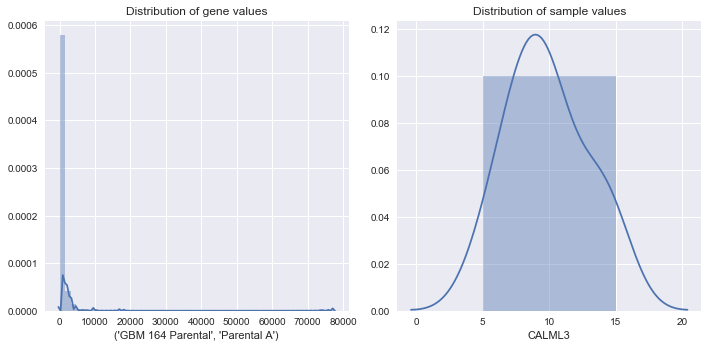

In [34]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10,5));
sns.distplot(df_jan_2018.iloc[:, 0].values.flatten().tolist(), ax = ax1, axlabel=df_jan_2018.columns[0]);
ax1.set_title('Distribution of gene values');
sns.distplot(df_jan_2018.iloc[0, :].values.flatten().tolist(), ax = ax2, axlabel=df_jan_2018.index[0]);
ax2.set_title('Distribution of sample values');
fig.tight_layout();

# Normalize Data

#### Positive Control Normalization

In [35]:
norm_factor = np.mean(stats.mstats.gmean(df_jan_2018_positive_controls.values.tolist()))/stats.mstats.gmean(df_jan_2018_positive_controls.values.tolist())

In [36]:
df_jan_2018 = df_jan_2018.apply(lambda x: x/norm_factor, axis=1)

In [37]:
df_jan_2018.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)","(GBM 164 TMZ sensitive 6days, S 6 B)","(GBM 164 TMZ sensitive 6days, S 6 C)"
GeneSymbol,,,,,,,,,,,,
CALML3,9.461712,15.754385,4.092401,10.852664,10.281052,8.605434,12.452879,8.202705,7.001414,8.756345,7.773421,15.091258
PIK3R2,1426.826157,2215.066475,1329.211740,2847.738905,2652.511490,1949.608806,2006.692535,1415.339410,2346.473867,1828.981504,1472.508016,1785.411904
IL11RA,23.654280,30.458477,13.095682,34.728523,30.843157,28.684779,19.568810,10.439806,35.007070,63.483499,44.419548,62.686764
BAMBI,529.855867,677.438538,440.342313,434.106540,394.107004,292.584745,540.810754,366.138910,615.124223,589.958726,521.929689,614.098112
PLA2G10,7.569370,6.301754,1.636960,6.511598,17.135087,11.473912,4.447457,2.237101,6.001212,13.134517,11.104887,10.447794


#### Content or Housekeeping Gene Normalization

In [38]:
norm_factor = np.mean(stats.mstats.gmean(df_jan_2018_house_keeping.values.tolist()))/stats.mstats.gmean(df_jan_2018_house_keeping.values.tolist())

In [39]:
df_jan_2018 = df_jan_2018.apply(lambda x: np.log(x/norm_factor+1), axis=1)

In [40]:
df_jan_2018.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)","(GBM 164 TMZ sensitive 6days, S 6 B)","(GBM 164 TMZ sensitive 6days, S 6 C)"
GeneSymbol,,,,,,,,,,,,
CALML3,2.187989,2.871245,1.494332,2.635699,2.419968,2.137745,2.667720,2.043726,2.179681,2.385685,2.103854,2.895928
PIK3R2,7.085837,7.759296,7.024315,8.131496,7.880176,7.435852,7.678537,7.056510,7.874620,7.631367,7.218508,7.612879
IL11RA,3.034623,3.502772,2.489922,3.748322,3.457467,3.255567,3.094141,2.256736,3.694300,4.284030,3.740754,4.277110
BAMBI,6.096650,6.575545,5.921321,6.252139,5.975701,5.542557,6.368616,5.706864,6.536845,6.500923,6.182652,6.546571
PLA2G10,1.992495,2.036481,0.868168,2.171546,2.894575,2.395504,1.755829,1.041174,2.044201,2.759995,2.423247,2.552461


# Plot example of the data distribution

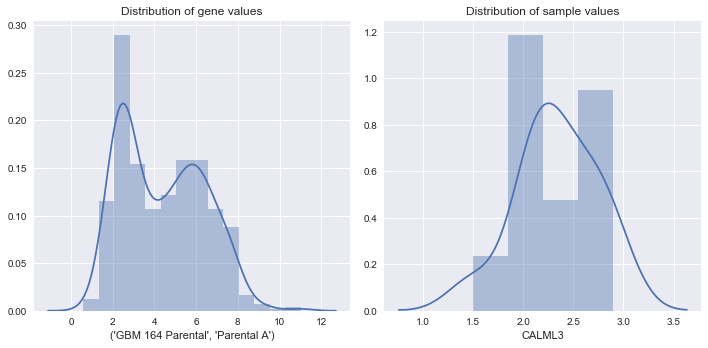

In [41]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10,5));
sns.distplot(df_jan_2018.iloc[:, 0].values.flatten().tolist(), ax = ax1, axlabel=df_jan_2018.columns[0]);
ax1.set_title('Distribution of gene values');
sns.distplot(df_jan_2018.iloc[0, :].values.flatten().tolist(), ax = ax2, axlabel=df_jan_2018.index[0]);
ax2.set_title('Distribution of sample values');
fig.tight_layout();

# Load Data

#### May 2018 data

In [42]:
df_may_2018 = pd.read_excel('Input/Combined Gallo 20180525_May 2018.xls', skiprows=24)

In [43]:
df_may_2018.columns

Index(['Unnamed: 0', 'Unnamed: 1', 'Unnamed: 2', 'GBM 164 Parental',
       'Unnamed: 4', 'Unnamed: 5', 'GBM 164 5uM TMZ Resistant', 'Unnamed: 7',
       'Unnamed: 8', 'GBM164 100nM AGI5198', 'Unnamed: 10', 'Unnamed: 11',
       'GBM164 5uM TMZ R +AGI 100nM', 'Unnamed: 13', 'Unnamed: 14'],
      dtype='object')

In [44]:
df_may_2018.columns[[3, 6, 9, 12]]

Index(['GBM 164 Parental', 'GBM 164 5uM TMZ Resistant', 'GBM164 100nM AGI5198',
       'GBM164 5uM TMZ R +AGI 100nM'],
      dtype='object')

In [45]:
df_may_2018.iloc[0, 3:].values

array(['P_01', 'P_05', 'P_09', '5R_02', '5R_06', '5R_10', 'A_03', 'A_07',
       'A_11', '5RA_04', '5RA_08', '5RA_12'], dtype=object)

In [46]:
list(zip(df_may_2018.columns[[3, 3, 3, 6, 6, 6, 6, 9, 9, 9, 12, 12, 12]], df_may_2018.iloc[0, 3:].values))

[('GBM 164 Parental', 'P_01'),
 ('GBM 164 Parental', 'P_05'),
 ('GBM 164 Parental', 'P_09'),
 ('GBM 164 5uM TMZ Resistant', '5R_02'),
 ('GBM 164 5uM TMZ Resistant', '5R_06'),
 ('GBM 164 5uM TMZ Resistant', '5R_10'),
 ('GBM 164 5uM TMZ Resistant', 'A_03'),
 ('GBM164 100nM AGI5198', 'A_07'),
 ('GBM164 100nM AGI5198', 'A_11'),
 ('GBM164 100nM AGI5198', '5RA_04'),
 ('GBM164 5uM TMZ R +AGI 100nM', '5RA_08'),
 ('GBM164 5uM TMZ R +AGI 100nM', '5RA_12')]

In [47]:
columns = list(zip(df_may_2018.columns[[3, 3, 3, 6, 6, 6, 9, 9, 9, 12, 12, 12]], df_may_2018.iloc[0, 3:].values))

In [48]:
columns.insert(0, 'Accession')

In [49]:
columns.insert(0, 'GeneSymbol')

In [50]:
columns.insert(0, 'CodeClass')

In [51]:
columns

['CodeClass',
 'GeneSymbol',
 'Accession',
 ('GBM 164 Parental', 'P_01'),
 ('GBM 164 Parental', 'P_05'),
 ('GBM 164 Parental', 'P_09'),
 ('GBM 164 5uM TMZ Resistant', '5R_02'),
 ('GBM 164 5uM TMZ Resistant', '5R_06'),
 ('GBM 164 5uM TMZ Resistant', '5R_10'),
 ('GBM164 100nM AGI5198', 'A_03'),
 ('GBM164 100nM AGI5198', 'A_07'),
 ('GBM164 100nM AGI5198', 'A_11'),
 ('GBM164 5uM TMZ R +AGI 100nM', '5RA_04'),
 ('GBM164 5uM TMZ R +AGI 100nM', '5RA_08'),
 ('GBM164 5uM TMZ R +AGI 100nM', '5RA_12')]

In [52]:
df_may_2018.columns = columns

In [53]:
df_may_2018.drop(df_may_2018.index[0], axis=0, inplace=True)

In [54]:
df_may_2018.drop(df_may_2018.index[0], axis=0, inplace=True)

In [55]:
df_may_2018.drop('Accession', axis=1, inplace=True)

In [56]:
df_may_2018.set_index('GeneSymbol', inplace=True)

In [57]:
df_may_2018.head()

,CodeClass,"(GBM 164 Parental, P_01)","(GBM 164 Parental, P_05)","(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,,
CALML3,Endogenous,16,10,16,7,3,16,13,17,12,9,14,7
PIK3R2,Endogenous,1800,1840,1560,1958,1258,2008,543,677,522,1084,1075,886
IL11RA,Endogenous,23,17,16,31,17,29,16,26,17,30,19,15
BAMBI,Endogenous,595,548,528,362,240,284,183,225,171,294,363,284
PLA2G10,Endogenous,6,12,8,7,5,11,10,8,2,9,8,5


In [58]:
df_may_2018_positive_controls = df_may_2018[df_may_2018['CodeClass'] == 'Positive'].copy()

In [59]:
df_may_2018_positive_controls = df_may_2018_positive_controls.iloc[:, 1:]

In [60]:
df_may_2018_positive_controls

,"(GBM 164 Parental, P_01)","(GBM 164 Parental, P_05)","(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,
POS_C(8),1508,1422,1406,1529,1144,1359,1701,1904,1383,1464,1407,1152
POS_A(128),17950,16869,15944,22019,16046,17969,19487,22085,16437,16909,16436,13903
POS_F(0.125),41,40,32,36,20,38,34,26,32,37,29,26
POS_D(2),298,370,304,418,281,346,333,381,318,327,314,284
POS_B(32),4741,4587,4634,4587,3385,4002,5098,5815,4477,4399,4486,3598
POS_E(0.5),68,70,58,99,56,62,77,95,66,78,78,69


In [61]:
df_may_2018_house_keeping = df_may_2018[df_may_2018['CodeClass'] == 'Housekeeping'].copy() 

In [62]:
df_may_2018_house_keeping = df_may_2018_house_keeping.iloc[:, 1:]

In [63]:
df_may_2018_house_keeping

,"(GBM 164 Parental, P_01)","(GBM 164 Parental, P_05)","(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,
TRIM39,164,162,132,208,140,178,81,74,65,124,127,115
TMUB2,229,231,221,377,265,351,92,144,115,274,256,238
EIF2B4,511,505,420,386,304,430,188,248,178,393,396,338
DNAJC14,201,212,184,167,101,173,50,82,67,112,139,110
C10orf76,191,219,170,165,130,166,107,107,99,196,209,167
HDAC3,525,509,447,472,322,432,181,255,185,392,393,382
ACAD9,466,478,435,276,208,274,154,200,131,280,329,281
TLK2,573,603,493,679,555,722,245,280,207,506,476,396
ERCC3,208,239,186,238,193,271,109,126,93,203,224,186


In [64]:
df_may_2018_controls = df_may_2018_positive_controls.index.tolist()

In [65]:
df_may_2018_controls.extend(df_may_2018_house_keeping.index.tolist())

In [66]:
df_may_2018_controls.extend(['NEG_A(0)', 'NEG_B(0)', 'NEG_C(0)', 'NEG_D(0)', 'NEG_E(0)', 'NEG_F(0)', 'NEG_G(0)', 'NEG_H(0)'])

In [67]:
df_may_2018 = df_may_2018.iloc[~df_may_2018.index.isin(df_may_2018_controls), 1:]

In [68]:
df_may_2018.dropna(how='all', axis=0, inplace=True)

In [69]:
df_may_2018.head()

,"(GBM 164 Parental, P_01)","(GBM 164 Parental, P_05)","(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,
CALML3,16,10,16,7,3,16,13,17,12,9,14,7
PIK3R2,1800,1840,1560,1958,1258,2008,543,677,522,1084,1075,886
IL11RA,23,17,16,31,17,29,16,26,17,30,19,15
BAMBI,595,548,528,362,240,284,183,225,171,294,363,284
PLA2G10,6,12,8,7,5,11,10,8,2,9,8,5


# Plot example of the data distribution

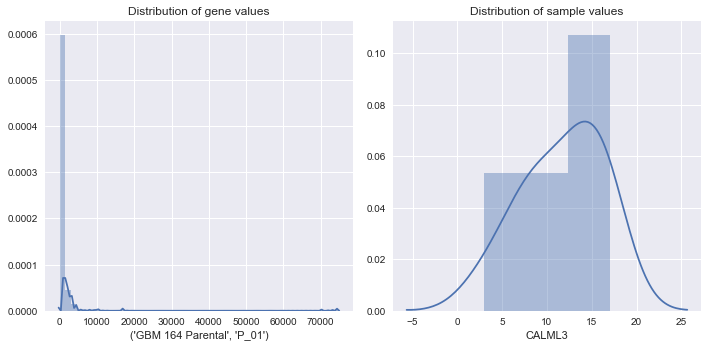

In [70]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10,5));
sns.distplot(df_may_2018.iloc[:, 0].values.flatten().tolist(), ax = ax1, axlabel=df_may_2018.columns[0]);
ax1.set_title('Distribution of gene values');
sns.distplot(df_may_2018.iloc[0, :].values.flatten().tolist(), ax = ax2, axlabel=df_may_2018.index[0]);
ax2.set_title('Distribution of sample values');
fig.tight_layout();

# Normalize Data

#### Positive Control Normalization

In [71]:
norm_factor = np.mean(stats.mstats.gmean(df_may_2018_positive_controls.values.tolist()))/stats.mstats.gmean(df_may_2018_positive_controls.values.tolist())

In [72]:
df_may_2018 = df_may_2018.apply(lambda x: x/norm_factor, axis=1)

In [73]:
df_may_2018.head()

,"(GBM 164 Parental, P_01)","(GBM 164 Parental, P_05)","(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,
CALML3,16.521972,10.441927,14.953841,8.216883,2.335079,15.738610,14.167339,19.955962,11.506445,9.236762,13.593285,5.830328
PIK3R2,1858.721805,1921.314615,1457.999545,2298.379528,979.176625,1975.195583,591.758841,794.716859,500.530337,1112.516722,1043.770089,737.952888
IL11RA,23.750334,17.751276,14.953841,36.389053,13.232117,28.526231,17.436725,30.520884,16.300796,30.789208,18.448029,12.493559
BAMBI,614.410819,572.217613,493.476769,424.930229,186.806351,279.360331,199.432538,264.123033,163.966835,301.734240,352.454458,236.544718
PLA2G10,6.195739,12.530313,7.476921,8.216883,3.891799,10.820295,10.897953,9.391041,1.917741,9.236762,7.767591,4.164520


#### Content or Housekeeping Gene Normalization

In [74]:
norm_factor = np.mean(stats.mstats.gmean(df_may_2018_house_keeping.values.tolist()))/stats.mstats.gmean(df_may_2018_house_keeping.values.tolist())

In [75]:
df_may_2018 = df_may_2018.apply(lambda x: np.log(x/norm_factor+1), axis=1)

In [76]:
df_may_2018.head()

,"(GBM 164 Parental, P_01)","(GBM 164 Parental, P_05)","(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,
CALML3,3.093694,2.698221,2.902268,2.407824,1.148221,3.024226,2.211076,2.704191,1.932262,2.360071,2.768943,1.858230
PIK3R2,7.770675,7.843851,7.426253,7.947624,6.806441,7.807123,5.830113,6.321179,5.552465,7.052952,7.046051,6.530954
IL11RA,3.442706,3.200736,2.902268,3.823668,2.580062,3.596908,2.397954,3.105636,2.237041,3.495669,3.057679,2.533535
BAMBI,6.664549,6.633529,6.344071,6.261146,5.154484,5.853669,4.748252,5.223214,4.444389,5.750440,5.962084,5.396297
PLA2G10,2.185703,2.869259,2.262566,2.407824,1.523364,2.671381,1.981058,2.023010,0.685209,2.360071,2.255300,1.582269


# Plot example of the data distribution

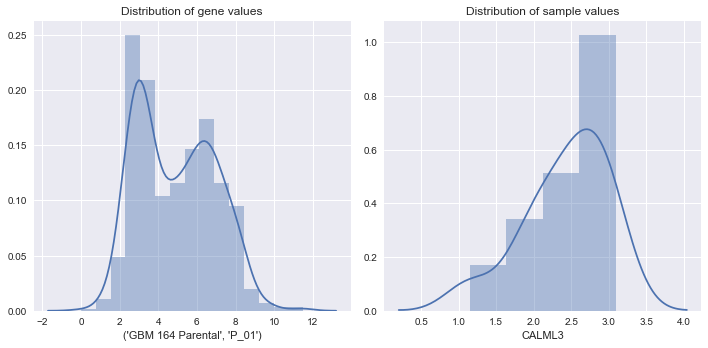

In [77]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10,5));
sns.distplot(df_may_2018.iloc[:, 0].values.flatten().tolist(), ax = ax1, axlabel=df_may_2018.columns[0]);
ax1.set_title('Distribution of gene values');
sns.distplot(df_may_2018.iloc[0, :].values.flatten().tolist(), ax = ax2, axlabel=df_may_2018.index[0]);
ax2.set_title('Distribution of sample values');
fig.tight_layout();

# Combine Datasets

In [78]:
df_jan_2018.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)","(GBM 164 TMZ sensitive 6days, S 6 B)","(GBM 164 TMZ sensitive 6days, S 6 C)"
GeneSymbol,,,,,,,,,,,,
CALML3,2.187989,2.871245,1.494332,2.635699,2.419968,2.137745,2.667720,2.043726,2.179681,2.385685,2.103854,2.895928
PIK3R2,7.085837,7.759296,7.024315,8.131496,7.880176,7.435852,7.678537,7.056510,7.874620,7.631367,7.218508,7.612879
IL11RA,3.034623,3.502772,2.489922,3.748322,3.457467,3.255567,3.094141,2.256736,3.694300,4.284030,3.740754,4.277110
BAMBI,6.096650,6.575545,5.921321,6.252139,5.975701,5.542557,6.368616,5.706864,6.536845,6.500923,6.182652,6.546571
PLA2G10,1.992495,2.036481,0.868168,2.171546,2.894575,2.395504,1.755829,1.041174,2.044201,2.759995,2.423247,2.552461


In [79]:
df_may_2018.head()

,"(GBM 164 Parental, P_01)","(GBM 164 Parental, P_05)","(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,
CALML3,3.093694,2.698221,2.902268,2.407824,1.148221,3.024226,2.211076,2.704191,1.932262,2.360071,2.768943,1.858230
PIK3R2,7.770675,7.843851,7.426253,7.947624,6.806441,7.807123,5.830113,6.321179,5.552465,7.052952,7.046051,6.530954
IL11RA,3.442706,3.200736,2.902268,3.823668,2.580062,3.596908,2.397954,3.105636,2.237041,3.495669,3.057679,2.533535
BAMBI,6.664549,6.633529,6.344071,6.261146,5.154484,5.853669,4.748252,5.223214,4.444389,5.750440,5.962084,5.396297
PLA2G10,2.185703,2.869259,2.262566,2.407824,1.523364,2.671381,1.981058,2.023010,0.685209,2.360071,2.255300,1.582269


In [80]:
df = pd.concat([df_jan_2018, df_may_2018], axis=1)

In [81]:
df.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,,,,,,,,,,
CALML3,2.187989,2.871245,1.494332,2.635699,2.419968,2.137745,2.667720,2.043726,2.179681,2.385685,...,2.902268,2.407824,1.148221,3.024226,2.211076,2.704191,1.932262,2.360071,2.768943,1.858230
PIK3R2,7.085837,7.759296,7.024315,8.131496,7.880176,7.435852,7.678537,7.056510,7.874620,7.631367,...,7.426253,7.947624,6.806441,7.807123,5.830113,6.321179,5.552465,7.052952,7.046051,6.530954
IL11RA,3.034623,3.502772,2.489922,3.748322,3.457467,3.255567,3.094141,2.256736,3.694300,4.284030,...,2.902268,3.823668,2.580062,3.596908,2.397954,3.105636,2.237041,3.495669,3.057679,2.533535
BAMBI,6.096650,6.575545,5.921321,6.252139,5.975701,5.542557,6.368616,5.706864,6.536845,6.500923,...,6.344071,6.261146,5.154484,5.853669,4.748252,5.223214,4.444389,5.750440,5.962084,5.396297
PLA2G10,1.992495,2.036481,0.868168,2.171546,2.894575,2.395504,1.755829,1.041174,2.044201,2.759995,...,2.262566,2.407824,1.523364,2.671381,1.981058,2.023010,0.685209,2.360071,2.255300,1.582269


In [82]:
df.shape

(730, 24)

# Plot example of the data distribution

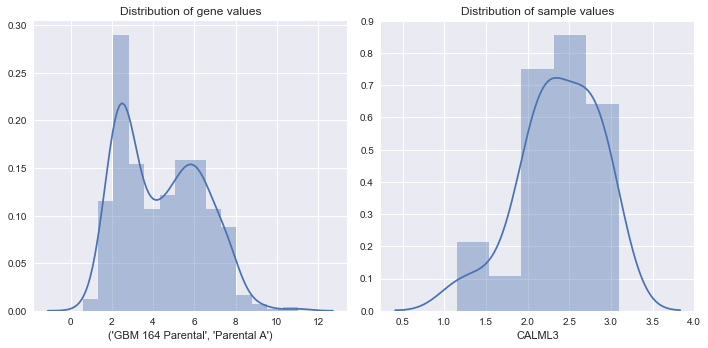

In [83]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10,5));
sns.distplot(df.iloc[:, 0].values.flatten().tolist(), ax = ax1, axlabel=df.columns[0]);
ax1.set_title('Distribution of gene values');
sns.distplot(df.iloc[0, :].values.flatten().tolist(), ax = ax2, axlabel=df.index[0]);
ax2.set_title('Distribution of sample values');
fig.tight_layout();

# Normalize Data

In [84]:
normalized_df = df.copy()

quantile normalize

In [85]:
#compute rank
dic = {}
for i,col in enumerate(normalized_df.columns):

    progressPercent = ((i+1)/len(normalized_df.columns))*100

    sys.stdout.write("Step 1/2 progress: %d%%  %d Out of %d   \r" % (progressPercent, (i+1), len(normalized_df.columns)))
    sys.stdout.flush()

    dic.update({col : sorted(normalized_df[col])})

sorted_df = pd.DataFrame(dic)
rank = sorted_df.mean(axis = 1).tolist()
#sort
for i,col in enumerate(normalized_df):

    progressPercent = ((i+1)/len(normalized_df.columns))*100

    sys.stdout.write("Step 2/2 progress: %d%%  %d Out of %d   \r" % (progressPercent, (i+1), len(normalized_df.columns)))
    sys.stdout.flush()

    t = np.searchsorted(np.sort(normalized_df[col]), normalized_df[col])
    normalized_df[col] = [rank[i] for i in t]

z-score

In [86]:
for i, index in enumerate(normalized_df.index):
    
    percent = (i+1)/len(normalized_df.index)*100
    
    sys.stdout.write("Progress: %d%% which is %d Out of %d   \r" % (percent, (i+1), len(normalized_df.index)))
    sys.stdout.flush()

    median_y = np.median(normalized_df.iloc[i, :])
    median_absolute_deviation_y = np.median([np.abs(y - median_y) for y in normalized_df.iloc[i, :]])
    mean_absolute_deviation_y = np.mean([np.abs(y - median_y) for y in normalized_df.iloc[i, :]])
    
    if median_absolute_deviation_y !=0:
        normalized_df.iloc[i,:] = normalized_df.iloc[i,:].apply(lambda y: 0.6745*(y - median_y)/ median_absolute_deviation_y)
    else:
        normalized_df.iloc[i,:] = normalized_df.iloc[i,:].apply(lambda y: (y - median_y) / ( 1.253314 * mean_absolute_deviation_y ))


In [87]:
normalized_df.replace(np.nan, 0, inplace=True)

In [88]:
normalized_df.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,,,,,,,,,,
CALML3,-0.044572,0.528369,-0.820755,-0.373401,-0.702026,-0.129495,0.539220,0.614321,-0.844760,-0.672905,...,0.766163,-0.719783,-1.307510,0.869440,0.517755,0.676095,0.825222,0.044572,0.705211,-0.044572
PIK3R2,-0.403506,-0.134187,-0.047801,0.987582,1.061742,1.187559,0.620138,0.887428,0.620138,-0.333887,...,0.047801,1.765874,1.452082,2.131496,-0.751006,-0.709884,-0.469387,-0.751006,-1.076450,-1.166789
IL11RA,0.247164,0.272505,-0.990287,0.180114,-0.374949,0.660796,-0.422468,-1.292528,1.020755,1.991111,...,-1.520303,0.716493,-0.278055,0.567024,-1.110898,0.126861,-0.144245,0.688204,-0.592298,-0.714165
BAMBI,1.146309,0.865120,1.006432,-0.975183,-0.805974,-0.873494,0.544493,0.865120,0.622254,-0.169092,...,1.239648,0.126104,-0.299873,-0.903324,0.047064,0.000000,-0.055710,-0.726746,-0.082808,-0.339969
PLA2G10,0.032392,-0.959017,-1.878039,-1.175921,0.936270,0.969876,-0.816092,-1.227632,-0.816092,0.612259,...,0.032392,-0.276010,-0.170357,0.801021,0.701193,-0.147579,-2.067046,0.612259,0.097309,0.000000


# Plot example of the data distribution

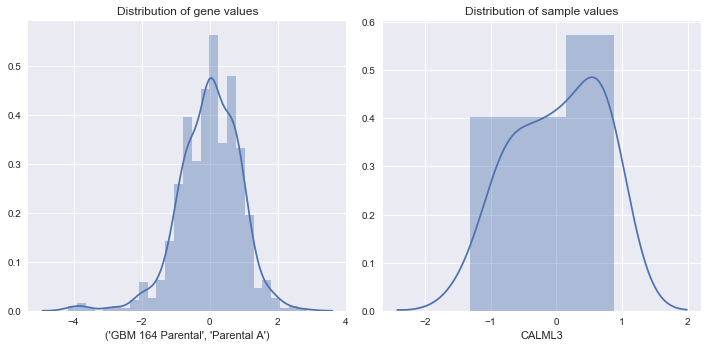

In [89]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10,5));
sns.distplot(normalized_df.iloc[:, 0].values.flatten().tolist(), ax = ax1, axlabel=normalized_df.columns[0]);
ax1.set_title('Distribution of gene values');
sns.distplot(normalized_df.iloc[0, :].values.flatten().tolist(), ax = ax2, axlabel=normalized_df.index[0]);
ax2.set_title('Distribution of sample values');
fig.tight_layout();

In [90]:
np.mean(normalized_df.iloc[:, 0].values.flatten().tolist())

-0.0077221543618917025

In [91]:
np.std(normalized_df.iloc[:, 0].values.flatten().tolist())

0.8958467836471453

In [92]:
max(normalized_df.iloc[:, 0].values.flatten().tolist())

2.8464758796423126

In [93]:
min(normalized_df.iloc[:, 0].values.flatten().tolist())

-4.1632156314864615

# plot PCA

In [94]:
meta = normalized_df.columns

In [95]:
meta

Index([       ('GBM 164 Parental', 'Parental A'),
              ('GBM 164 Parental', 'Parental B'),
              ('GBM 164 Parental', 'Parental C'),
           ('GBM 164 10uM TMZ Resistant', 'R A'),
           ('GBM 164 10uM TMZ Resistant', 'R B'),
           ('GBM 164 10uM TMZ Resistant', 'R C'),
         ('GBM 164 10uM TMZ Resistant', 'S 2 A'),
        ('GBM 164 TMZ sensitive 2days', 'S 2 B'),
        ('GBM 164 TMZ sensitive 2days', 'S 2 C'),
        ('GBM 164 TMZ sensitive 2days', 'S 6 A'),
        ('GBM 164 TMZ sensitive 6days', 'S 6 B'),
        ('GBM 164 TMZ sensitive 6days', 'S 6 C'),
                    ('GBM 164 Parental', 'P_01'),
                    ('GBM 164 Parental', 'P_05'),
                    ('GBM 164 Parental', 'P_09'),
          ('GBM 164 5uM TMZ Resistant', '5R_02'),
          ('GBM 164 5uM TMZ Resistant', '5R_06'),
          ('GBM 164 5uM TMZ Resistant', '5R_10'),
                ('GBM164 100nM AGI5198', 'A_03'),
                ('GBM164 100nM AGI5198', 'A_07'),


In [96]:
meta_df = pd.DataFrame()

In [97]:
meta_df['Sample'] = [x[1] for x in meta]

In [98]:
meta_df['Group'] = [x[0] for x in meta]

In [99]:
meta_df.set_index('Sample', inplace=True)

In [100]:
meta_df.head()

,Group
Sample,
Parental A,GBM 164 Parental
Parental B,GBM 164 Parental
Parental C,GBM 164 Parental
R A,GBM 164 10uM TMZ Resistant
R B,GBM 164 10uM TMZ Resistant


In [101]:
rcParams['pdf.fonttype'] = 42 ## Output Type 3 (Type3) or Type 42 (TrueType)
rcParams['font.sans-serif'] = 'Arial'
# ignore FutureWarning that may pop up when plotting
import warnings
warnings.filterwarnings("ignore")
import urllib3
urllib3.disable_warnings()

In [102]:
# to display hyperlink as <a> tag in output cells
def display_link(url):
    raw_html = '<a href="%s" target="_blank">%s</a>' % (url, url)
    return display(HTML(raw_html))

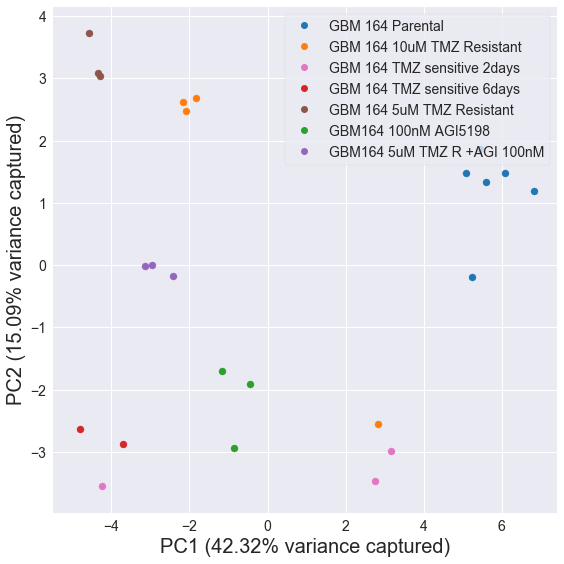

In [103]:
RNAseq.PCA_plot(
    normalized_df.values, 
    meta_df['Group'], 
    standardize=2, log=True, 
    show_text=False, 
    sep='|', 
    legend_loc='upper right')

# We can also plot a 3D interactive PCA plot using plotly

In [104]:
# Compute the coordinates of samples in the PCA space
variance_explained, pca_transformed = RNAseq.perform_PCA(normalized_df.values, standardize=2, log=True)
# Bind x, y, z coordinates to meta_df
meta_df['x'] = pca_transformed[:,0]
meta_df['y'] = pca_transformed[:,1]
meta_df['z'] = pca_transformed[:,2]

In [105]:
import plotly
plotly.offline.init_notebook_mode() # To embed plots in the output cell of the notebook
import plotly.graph_objs as go

SYMBOLS = ['circle', 'square']
COLORS = RNAseq.COLORS10

genotypes = meta_df.Group.unique().tolist()
# perturbations = meta_df.perturbation.unique().tolist()

data = [] # To collect all Scatter3d instances
for geno, meta_df_sub in meta_df.groupby(['Group']):
    # Iteratate through samples grouped by condition and platform
    display_name = '%s' % geno
    # Initiate a Scatter3d instance for each group of samples specifying their coordinates
    # and displaying attributes including color, shape, size and etc.
    trace = go.Scatter3d(
        x=meta_df_sub['x'],
        y=meta_df_sub['y'],
        z=meta_df_sub['z'],
        text=meta_df_sub.index,
        mode='markers',
        marker=dict(
            size=10,
            color=COLORS[genotypes.index(geno)], # Color by genotypes
#             symbol=SYMBOLS[perturbations.index(pert)], # Shaped by perturbations
            opacity=.8,
        ),
        name=display_name,
    )
    
    data.append(trace)

# Configs for layout and axes
layout=dict(height=1000, width=1000, 
            title='3D PCA plot for samples in this study',
            scene=dict(
                xaxis=dict(title='PC1 (%.2f%% variance)' % variance_explained[0]),
                yaxis=dict(title='PC2 (%.2f%% variance)' % variance_explained[1]),
                zaxis=dict(title='PC3 (%.2f%% variance)' % variance_explained[2])
               )
)
fig=dict(data=data, layout=layout)
plotly.offline.iplot(fig)

# Subset the expression DataFrame using top 100 genes with largest variance

In [106]:
variances = np.var(normalized_df, axis=1)
srt_idx = variances.argsort()[::-1]
expr_df_sub = normalized_df.iloc[srt_idx].iloc[:100]

In [107]:
expr_df_sub.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
GeneSymbol,,,,,,,,,,,,,,,,,,,,,
HSPA1A,-1.658857,-0.793066,-0.296541,-0.346201,0.232823,-1.424930,-0.031366,-0.031366,0.811996,0.315342,...,-2.307022,17.605219,17.701299,16.818535,5.566711,5.046831,6.640961,-0.159602,0.031366,0.555934
SMAD9,-0.093580,0.697101,-0.628137,3.785690,2.698257,3.029505,-0.912210,-1.392643,-1.392643,11.947213,...,0.218398,-0.182672,0.651899,0.504392,-0.238307,0.093580,-0.912210,0.218398,-0.382632,-0.912210
PLAT,0.674500,0.674500,0.674500,3.233697,3.233697,3.233697,-1.661235,-0.674500,-1.661235,-10.120641,...,0.674500,-5.176657,-5.176657,-5.176657,0.674500,0.674500,0.674500,-0.674500,-0.674500,-0.674500
NOTCH3,0.106664,-0.683256,0.000000,0.000000,0.665744,0.532264,-1.526926,-0.650725,-1.568576,0.452649,...,-0.713558,-0.905390,-0.150677,-1.206280,5.726047,6.190341,5.471872,9.507125,9.362479,9.507125
PBX3,0.969017,0.855014,0.493986,-1.575974,-1.793239,-0.065310,-0.927362,-0.214547,0.359502,0.359502,...,-0.065310,-10.247357,-9.633451,-8.379700,-2.607211,-1.180525,0.164081,-0.065310,0.493986,0.493986


In [108]:
expr_df_sub.shape

(100, 24)

In [109]:
expr_df_sub.to_csv('Output/expression_matrix_top_100_genes.txt', sep='\t')

# POST the expression matrix to Clustergrammer and get the URL

In [110]:
# The working directory to store all the sequencing data, will be created if not exists
os.environ['WORKDIR'] = 'Output/'

In [111]:
import requests, json
clustergrammer_url = 'http://amp.pharm.mssm.edu/clustergrammer/matrix_upload/'

expr_df_sub_file = os.path.join(os.environ['WORKDIR'], 'expression_matrix_top_100_genes.txt')

r = requests.post(clustergrammer_url, files={'file': open(expr_df_sub_file, 'rb')})
link = r.text
display_link(link)

We can also display the result in this notebook using ifram

In [112]:
from IPython.display import IFrame
display(IFrame(link, width="1000", height="1000"))

# Impute Genes

### Load and normalize ARCHS4 data

In [113]:
import h5py

filename = '/Users/moshesilverstein/Documents/Harmonizome/ARCHS4/Input/Human/Tissue/human_matrix.h5'
f = h5py.File(filename, 'r')

In [114]:
matrix = pd.DataFrame(data = f['data/expression'][:,:])

In [115]:
matrix = matrix.T

In [116]:
matrix.head()

,0,1,2,3,4,5,6,7,8,9,...,65419,65420,65421,65422,65423,65424,65425,65426,65427,65428
0,124,0,0,0,108,0,0,0,0,0,...,82,81,86,133,597,808,458,435,766,525
1,77,0,0,0,56,0,0,0,0,0,...,7,6,5,4,3,11,6,7,14,8
2,10743,189,1518,1873,26007,835,1077,12724,545,1100,...,234,8514,320,13332,41,42,45,30,73,25
3,28,6,0,0,20,0,0,0,0,0,...,13,12,24,15,10,10,5,7,15,9
4,119,0,0,0,69,0,0,0,0,0,...,13,15,23,14,2,1,1,0,0,1


In [117]:
matrix.shape

(35238, 65429)

In [118]:
gene_list = f['meta/genes'][:].tolist() 

In [119]:
lst = []
for gene in gene_list:
    lst.append(gene.decode("utf-8"))

gene_list = lst

In [120]:
matrix.index = gene_list

In [121]:
matrix.head()

,0,1,2,3,4,5,6,7,8,9,...,65419,65420,65421,65422,65423,65424,65425,65426,65427,65428
A1BG,124,0,0,0,108,0,0,0,0,0,...,82,81,86,133,597,808,458,435,766,525
A1CF,77,0,0,0,56,0,0,0,0,0,...,7,6,5,4,3,11,6,7,14,8
A2M,10743,189,1518,1873,26007,835,1077,12724,545,1100,...,234,8514,320,13332,41,42,45,30,73,25
A2ML1,28,6,0,0,20,0,0,0,0,0,...,13,12,24,15,10,10,5,7,15,9
A2MP1,119,0,0,0,69,0,0,0,0,0,...,13,15,23,14,2,1,1,0,0,1


## Normalize data

#### RPM Normalization

In [122]:
total = matrix.sum()

In [123]:
normalized_matrix = matrix.apply(lambda x: np.log((x/total)*10**6+1), axis=1)

In [124]:
normalized_matrix.head()

,0,1,2,3,4,5,6,7,8,9,...,65419,65420,65421,65422,65423,65424,65425,65426,65427,65428
A1BG,1.127483,0.000000,0.000000,0.000000,1.011994,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.571391,2.355863,2.167665,2.759701,1.753569,1.801998,1.509389,1.555131,1.587022,1.708625
A1CF,0.831387,0.000000,0.000000,0.000000,0.646038,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.708805,0.534856,0.371478,0.368086,0.023712,0.066639,0.045132,0.058377,0.068669,0.066627
A2M,5.203387,6.519726,8.420909,8.624844,6.046591,7.559889,8.173938,9.891514,6.977676,7.983841,...,3.569072,6.912265,3.394241,7.302545,0.283632,0.233577,0.297316,0.229233,0.315277,0.194994
A2ML1,0.386252,3.113717,0.000000,0.000000,0.280864,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.070130,0.881452,1.150383,0.981562,0.076948,0.060761,0.037750,0.058377,0.073398,0.074652
A2MP1,1.099840,0.000000,0.000000,0.000000,0.750824,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.070130,1.018127,1.121491,0.938984,0.015871,0.006245,0.007665,0.000000,0.000000,0.008575


### Get subset with overlapping genes

In [125]:
overlaping_genes = normalized_matrix.index.intersection(df.index)

In [126]:
matrix_overlapping = normalized_matrix.loc[overlaping_genes].copy()

In [127]:
df_overlapping = df.loc[overlaping_genes].copy()

### Build models and test models

In [128]:
n = 15
r2_scores = []
mean_abs_error_scores = []
mean_sqr_error_scores = []

models = {}

for i,col in enumerate(df.columns):
    
    top_value = 0
    top_sample = ''
    top_samples = []
    
    # Find Closest Samples
    for j,sample in enumerate(matrix_overlapping.columns):
        
        sys.stdout.write("Outer Progress: %d Out of %d Inner Progress: %d Out of %d  \r" % ((i+1), len(df_overlapping.columns), (j+1), len(matrix_overlapping.columns)))
        sys.stdout.flush()


        value = pearsonr(matrix_overlapping.loc[:, sample], df_overlapping.iloc[:, i])[0]
    #         value = cos_sim(matrix_overlapping.loc[selected_genes, sample], nano_data_overlapping.loc[selected_genes, col])
    #         value = normalized_mutual_info_score(matrix_overlapping.loc[selected_genes, sample], nano_data_overlapping.loc[selected_genes, col])
        if value > top_value:
            top_value = value
            top_samples.insert(0, sample)
        else:
            top_samples.append(sample)
            
    # Splitting the dataset into the Training set and Test set
    X_train, X_test, y_train, y_test = train_test_split(matrix_overlapping.loc[:, top_samples[0:n]], df_overlapping.iloc[:, i], test_size = 0.2)


    # Initializing the Sequential model from KERAS.
    model = Sequential()

    # Creating a 16 neuron hidden layer with Linear Rectified activation function.
    model.add(Dense(units = int(X_train.shape[1]), input_dim=X_train.shape[1], kernel_initializer='uniform', activation='relu'))

#     model.add(Dropout(0.1))

    # Creating a 16 neuron hidden layer with Linear Rectified activation function.
    model.add(Dense(units = X_train.shape[1], kernel_initializer='uniform', activation='relu'))
    
    # Creating a 16 neuron hidden layer with Linear Rectified activation function.
    model.add(Dense(units = X_train.shape[1], kernel_initializer='uniform', activation='relu'))
    
    # Creating a 16 neuron hidden layer with Linear Rectified activation function.
    model.add(Dense(units = X_train.shape[1], kernel_initializer='uniform', activation='relu'))
    
    # Creating a 16 neuron hidden layer with Linear Rectified activation function.
    model.add(Dense(units = X_train.shape[1], kernel_initializer='uniform', activation='relu'))
    
    
    # Adding a output layer.
    model.add(Dense(units = 1, kernel_initializer='uniform'))

    # Compiling the model
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    # Fitting the model
    model.fit(X_train, y_train, epochs=1300, batch_size=100, verbose=0);
    
#     for k in np.arange(0,9):
    
#         # Splitting the dataset into the Training set and Test set
#         X_train, X_test, y_train, y_test = train_test_split(matrix_overlapping.loc[:, top_samples[0:n]], df_overlapping.iloc[:, i], test_size = 0.2)

#         # Fitting the model
#         model.fit(X_train, y_train, epochs=1300, batch_size=100, verbose=0);
    
    models[col] = {'Model':model, 'Samples':top_samples[0:n]}
    
    y_test = df_overlapping.iloc[:, i]
    
    y_test = y_test.loc[X_test.index]
    
    y_pred = model.predict(matrix_overlapping.loc[X_test.index, top_samples[0:n]])

    r2_scores.append(r2_score(y_test, y_pred.flatten()))
    mean_abs_error_scores.append(mean_absolute_error(y_test, y_pred.flatten()))
    mean_sqr_error_scores.append(mean_squared_error(y_test, y_pred.flatten()))
    
    model.reset_states()

sys.stdout.write("Finished   \r")
sys.stdout.flush()

for sample_model in np.arange(0, len(r2_scores)):
    print('Column: %r    R^2: %r    MAE: %r    MSE: %r' % (df.columns[sample_model], r2_scores[sample_model],  mean_abs_error_scores[sample_model], mean_sqr_error_scores[sample_model])) 

Column: ('GBM 164 Parental', 'Parental A')    R^2: 0.6337527180593331    MAE: 0.880395765618476    MSE: 1.445399512360539
Column: ('GBM 164 Parental', 'Parental B')    R^2: 0.7452567646465218    MAE: 0.7619569907565592    MSE: 0.9812814160096791
Column: ('GBM 164 Parental', 'Parental C')    R^2: 0.6787966557963466    MAE: 0.8067692195613965    MSE: 1.3573061653174285
Column: ('GBM 164 10uM TMZ Resistant', 'R A')    R^2: 0.6265720921155202    MAE: 0.891919853939915    MSE: 1.5863446877757834
Column: ('GBM 164 10uM TMZ Resistant', 'R B')    R^2: 0.7040211490635191    MAE: 0.764634145649926    MSE: 1.1262349703865069
Column: ('GBM 164 10uM TMZ Resistant', 'R C')    R^2: 0.5720359742104824    MAE: 0.8842552785086433    MSE: 1.6637120506861163
Column: ('GBM 164 10uM TMZ Resistant', 'S 2 A')    R^2: 0.7414637237331674    MAE: 0.7713696993866557    MSE: 1.0226970434833107
Column: ('GBM 164 TMZ sensitive 2days', 'S 2 B')    R^2: 0.6379527823641314    MAE: 0.8515725296680562    MSE: 1.542755137

### Impute remaining genes

In [129]:
matrix_not_overlapping = normalized_matrix.loc[~normalized_matrix.index.isin(overlaping_genes)].copy()

In [130]:
matrix_not_overlapping.head()

,0,1,2,3,4,5,6,7,8,9,...,65419,65420,65421,65422,65423,65424,65425,65426,65427,65428
A1BG,1.127483,0.000000,0.000000,0.000000,1.011994,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.571391,2.355863,2.167665,2.759701,1.753569,1.801998,1.509389,1.555131,1.587022,1.708625
A1CF,0.831387,0.000000,0.000000,0.000000,0.646038,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.708805,0.534856,0.371478,0.368086,0.023712,0.066639,0.045132,0.058377,0.068669,0.066627
A2M,5.203387,6.519726,8.420909,8.624844,6.046591,7.559889,8.173938,9.891514,6.977676,7.983841,...,3.569072,6.912265,3.394241,7.302545,0.283632,0.233577,0.297316,0.229233,0.315277,0.194994
A2ML1,0.386252,3.113717,0.000000,0.000000,0.280864,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.070130,0.881452,1.150383,0.981562,0.076948,0.060761,0.037750,0.058377,0.073398,0.074652
A2MP1,1.099840,0.000000,0.000000,0.000000,0.750824,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.070130,1.018127,1.121491,0.938984,0.015871,0.006245,0.007665,0.000000,0.000000,0.008575


In [131]:
df_imputed = pd.DataFrame(columns=models.keys(), index=matrix_not_overlapping.index)

In [132]:
df_imputed.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
A1BG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2ML1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2MP1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [133]:
for sample in models.keys():
    values_pred = models[sample]['Model'].predict(matrix_not_overlapping.loc[:, models[sample]['Samples']])
    df_imputed[sample] = values_pred

In [134]:
df_imputed.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
A1BG,3.873719,4.535928,3.500938,4.677648,4.063171,3.525546,4.038166,3.466770,4.284921,4.555625,...,4.258929,4.838037,3.300143,4.586696,3.289748,3.901891,3.111504,3.976715,3.911971,3.519561
A1CF,2.087234,2.637040,2.156070,3.161056,2.543882,2.459495,2.537440,1.849242,2.685502,2.636233,...,2.095895,3.035882,2.410179,2.619231,2.152336,2.297101,1.543227,1.987001,2.376039,1.852103
A2M,3.833700,5.143075,4.322249,5.693696,4.890335,4.575385,4.841830,3.126908,4.861162,3.737133,...,4.420537,5.425880,3.871845,4.690997,3.013705,4.046457,2.494140,4.969651,4.863118,4.217763
A2ML1,2.689145,2.820701,2.292221,3.312086,2.701229,3.111341,2.916345,2.234322,2.766656,3.210441,...,2.610172,3.447729,2.961960,3.091338,2.526143,2.908512,1.945871,2.648200,2.715933,2.120457
A2MP1,2.293507,2.654342,2.020737,2.867780,2.874950,1.912818,2.524901,1.942208,2.603992,2.848708,...,2.581048,2.813370,2.012009,2.872378,2.088038,2.539161,1.591668,2.483236,2.579578,1.920171


In [424]:
df_imputed.shape

(34513, 24)

In [425]:
df_complete = pd.concat([df, df_imputed], axis=0)

In [426]:
df_complete.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
CALML3,2.187989,2.871245,1.494332,2.635699,2.419968,2.137745,2.667720,2.043726,2.179681,2.385685,...,2.902268,2.407824,1.148221,3.024226,2.211076,2.704191,1.932262,2.360071,2.768943,1.858230
PIK3R2,7.085837,7.759296,7.024315,8.131496,7.880176,7.435852,7.678537,7.056510,7.874620,7.631367,...,7.426253,7.947624,6.806441,7.807123,5.830113,6.321179,5.552465,7.052952,7.046051,6.530954
IL11RA,3.034623,3.502772,2.489922,3.748322,3.457467,3.255567,3.094141,2.256736,3.694300,4.284030,...,2.902268,3.823668,2.580062,3.596908,2.397954,3.105636,2.237041,3.495669,3.057679,2.533535
BAMBI,6.096650,6.575545,5.921321,6.252139,5.975701,5.542557,6.368616,5.706864,6.536845,6.500923,...,6.344071,6.261146,5.154484,5.853669,4.748252,5.223214,4.444389,5.750440,5.962084,5.396297
PLA2G10,1.992495,2.036481,0.868168,2.171546,2.894575,2.395504,1.755829,1.041174,2.044201,2.759995,...,2.262566,2.407824,1.523364,2.671381,1.981058,2.023010,0.685209,2.360071,2.255300,1.582269


In [427]:
df_complete.shape

(35243, 24)

# Normalize completed data

quantile normalize

In [428]:
#compute rank
dic = {}
for i,col in enumerate(df_complete.columns):

    progressPercent = ((i+1)/len(df_complete.columns))*100

    sys.stdout.write("Step 1/2 progress: %d%%  %d Out of %d   \r" % (progressPercent, (i+1), len(df_complete.columns)))
    sys.stdout.flush()

    dic.update({col : sorted(df_complete[col])})

sorted_df = pd.DataFrame(dic)
rank = sorted_df.mean(axis = 1).tolist()
#sort
for i,col in enumerate(df_complete):

    progressPercent = ((i+1)/len(df_complete.columns))*100

    sys.stdout.write("Step 2/2 progress: %d%%  %d Out of %d   \r" % (progressPercent, (i+1), len(df_complete.columns)))
    sys.stdout.flush()

    t = np.searchsorted(np.sort(df_complete[col]), df_complete[col])
    df_complete[col] = [rank[i] for i in t]

z-score

In [429]:
for i, index in enumerate(df_complete.index):
    
    percent = (i+1)/len(df_complete.index)*100
    
    sys.stdout.write("Progress: %d%% which is %d Out of %d   \r" % (percent, (i+1), len(df_complete.index)))
    sys.stdout.flush()

    median_y = np.median(df_complete.iloc[i, :])
    median_absolute_deviation_y = np.median([np.abs(y - median_y) for y in df_complete.iloc[i, :]])
    mean_absolute_deviation_y = np.mean([np.abs(y - median_y) for y in df_complete.iloc[i, :]])
    
    if median_absolute_deviation_y !=0:
        df_complete.iloc[i,:] = df_complete.iloc[i,:].apply(lambda y: 0.6745*(y - median_y)/ median_absolute_deviation_y)
    else:
        df_complete.iloc[i,:] = df_complete.iloc[i,:].apply(lambda y: (y - median_y) / ( 1.253314 * mean_absolute_deviation_y ))


## Filter out outliers caused by imputation

In [430]:
for i, col in enumerate(df_complete.columns):
    
    percent = (i+1)/len(df_complete.columns)*100
    
    sys.stdout.write("Progress: %d%% which is %d Out of %d   \r" % (percent, (i+1), len(df_complete.columns)))
    sys.stdout.flush()
    
#     stdv = np.std(df_complete[col])
    mean = np.mean(df_complete[col])
    
    values = np.array(df_complete[col].values.tolist())
    
#     ops = (add, sub)
#     op = random.choice(ops)
    
    weight = random.uniform(0, 2)
    
#     df_complete[col] = np.where(values > (mean+5*stdv), mean, values).tolist()
    df_complete[col] = np.where(values > 5, mean, values).tolist()
#     df_complete[col] = np.where(values > 5, op(mean, weight*stdv), values).tolist()
    
    values = np.array(df_complete[col].values.tolist())
    
#     df_complete[col] = np.where(values < (mean-5*stdv), mean, values).tolist()
    df_complete[col] = np.where(values < -5, mean, values).tolist()
#     df_complete[col] = np.where(values < -5, op(mean, weight*stdv), values).tolist()
    

In [431]:
df_complete.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
CALML3,-0.150650,0.464434,-1.410854,-0.994647,-0.352281,-0.109701,0.460793,0.543093,-0.683719,-0.644794,...,1.063893,-1.020659,-1.487151,0.981427,0.665281,0.961420,1.221712,-0.070291,0.764096,0.352046
PIK3R2,0.708302,-0.646158,-0.404998,1.539774,0.903537,0.865675,0.956328,0.194684,1.158357,0.029465,...,0.510944,0.848938,0.063792,1.951612,-1.300340,-0.549247,-0.311355,-0.969469,-0.897235,-0.702842
IL11RA,0.120627,-0.120627,-0.873671,0.185997,-0.382646,0.613371,-0.749286,-1.196417,1.353006,2.538873,...,-1.347328,0.735629,-0.373723,0.598959,-1.122893,0.149680,0.231391,1.542294,-0.362559,-0.349355
BAMBI,1.374959,0.087524,0.559406,-1.269285,-1.159559,-1.117904,0.689337,0.142207,0.522166,0.155814,...,0.930606,-0.802206,-0.871324,-1.408617,-0.929663,-0.695870,-0.543833,-0.811254,0.019268,-0.209939
PLA2G10,0.180379,-1.194522,-2.446759,-1.604466,1.035919,1.060360,-1.194522,-1.643401,-0.452987,0.830021,...,0.515521,-0.343386,0.013467,1.182671,0.485504,-0.197781,-2.690194,0.774033,0.167209,-0.246111


# Plot example of the data distribution

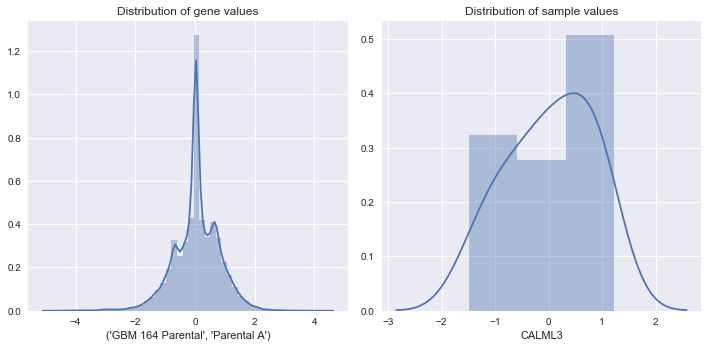

In [432]:
n = 0
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10,5));
sns.distplot(df_complete.iloc[:, n].values.flatten().tolist(), ax = ax1, axlabel=df_complete.columns[n]);
ax1.set_title('Distribution of gene values');
sns.distplot(df_complete.iloc[n, :].values.flatten().tolist(), ax = ax2, axlabel=df_complete.index[n]);
ax2.set_title('Distribution of sample values');
fig.tight_layout();

# plot PCA

#### Define metadata

In [433]:
meta = df_complete.columns

In [434]:
meta

Index([       ('GBM 164 Parental', 'Parental A'),
              ('GBM 164 Parental', 'Parental B'),
              ('GBM 164 Parental', 'Parental C'),
           ('GBM 164 10uM TMZ Resistant', 'R A'),
           ('GBM 164 10uM TMZ Resistant', 'R B'),
           ('GBM 164 10uM TMZ Resistant', 'R C'),
         ('GBM 164 10uM TMZ Resistant', 'S 2 A'),
        ('GBM 164 TMZ sensitive 2days', 'S 2 B'),
        ('GBM 164 TMZ sensitive 2days', 'S 2 C'),
        ('GBM 164 TMZ sensitive 2days', 'S 6 A'),
        ('GBM 164 TMZ sensitive 6days', 'S 6 B'),
        ('GBM 164 TMZ sensitive 6days', 'S 6 C'),
                    ('GBM 164 Parental', 'P_01'),
                    ('GBM 164 Parental', 'P_05'),
                    ('GBM 164 Parental', 'P_09'),
          ('GBM 164 5uM TMZ Resistant', '5R_02'),
          ('GBM 164 5uM TMZ Resistant', '5R_06'),
          ('GBM 164 5uM TMZ Resistant', '5R_10'),
                ('GBM164 100nM AGI5198', 'A_03'),
                ('GBM164 100nM AGI5198', 'A_07'),


In [435]:
meta_df = pd.DataFrame()

In [436]:
meta_df['Sample'] = [x[1] for x in meta]

In [437]:
meta_df['Group'] = [x[0] for x in meta]

In [438]:
meta_df.set_index('Sample', inplace=True)

In [439]:
meta_df.head()

,Group
Sample,
Parental A,GBM 164 Parental
Parental B,GBM 164 Parental
Parental C,GBM 164 Parental
R A,GBM 164 10uM TMZ Resistant
R B,GBM 164 10uM TMZ Resistant


In [440]:
rcParams['pdf.fonttype'] = 42 ## Output Type 3 (Type3) or Type 42 (TrueType)
rcParams['font.sans-serif'] = 'Arial'
# ignore FutureWarning that may pop up when plotting
import warnings
warnings.filterwarnings("ignore")
import urllib3
urllib3.disable_warnings()

In [441]:
# to display hyperlink as <a> tag in output cells
def display_link(url):
    raw_html = '<a href="%s" target="_blank">%s</a>' % (url, url)
    return display(HTML(raw_html))

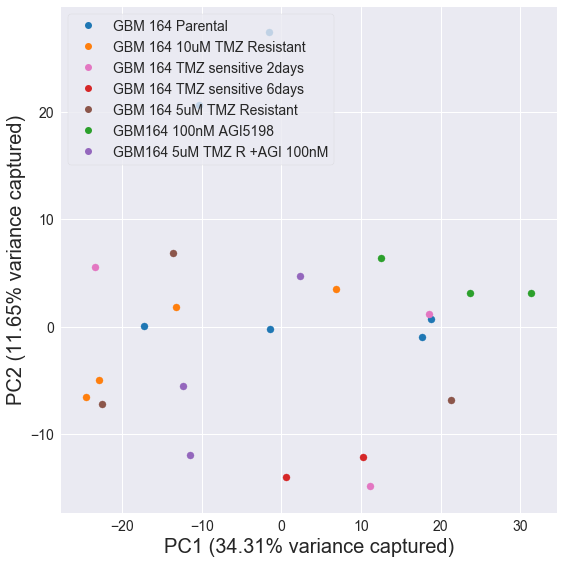

In [442]:
RNAseq.PCA_plot(
    df_complete.values, 
    meta_df['Group'], 
    standardize=2, log=True, 
    show_text=False, 
    sep='|', 
    legend_loc='upper left')

# We can also plot a 3D interactive PCA plot using plotly.

In [443]:
# Compute the coordinates of samples in the PCA space
variance_explained, pca_transformed = RNAseq.perform_PCA(df_complete.values, standardize=2, log=True)
# Bind x, y, z coordinates to meta_df
meta_df['x'] = pca_transformed[:,0]
meta_df['y'] = pca_transformed[:,1]
meta_df['z'] = pca_transformed[:,2]

In [444]:
import plotly
plotly.offline.init_notebook_mode() # To embed plots in the output cell of the notebook
import plotly.graph_objs as go

SYMBOLS = ['circle', 'square']
COLORS = RNAseq.COLORS10

genotypes = meta_df.Group.unique().tolist()
# perturbations = meta_df.perturbation.unique().tolist()

data = [] # To collect all Scatter3d instances
for geno, meta_df_sub in meta_df.groupby(['Group']):
    # Iteratate through samples grouped by condition and platform
    display_name = '%s' % geno
    # Initiate a Scatter3d instance for each group of samples specifying their coordinates
    # and displaying attributes including color, shape, size and etc.
    trace = go.Scatter3d(
        x=meta_df_sub['x'],
        y=meta_df_sub['y'],
        z=meta_df_sub['z'],
        text=meta_df_sub.index,
        mode='markers',
        marker=dict(
            size=10,
            color=COLORS[genotypes.index(geno)], # Color by genotypes
#             symbol=SYMBOLS[perturbations.index(pert)], # Shaped by perturbations
            opacity=.8,
        ),
        name=display_name,
    )
    
    data.append(trace)

# Configs for layout and axes
layout=dict(height=1000, width=1000, 
            title='3D PCA plot for samples in this study',
            scene=dict(
                xaxis=dict(title='PC1 (%.2f%% variance)' % variance_explained[0]),
                yaxis=dict(title='PC2 (%.2f%% variance)' % variance_explained[1]),
                zaxis=dict(title='PC3 (%.2f%% variance)' % variance_explained[2])
               )
)
fig=dict(data=data, layout=layout)
plotly.offline.iplot(fig)

# Subset the expression DataFrame using top 100 genes with largest variance

In [445]:
variances = np.var(df_complete, axis=1)
srt_idx = variances.argsort()[::-1]
expr_df_sub = df_complete.iloc[srt_idx].iloc[:100]

In [446]:
expr_df_sub.head()

,"(GBM 164 Parental, Parental A)","(GBM 164 Parental, Parental B)","(GBM 164 Parental, Parental C)","(GBM 164 10uM TMZ Resistant, R A)","(GBM 164 10uM TMZ Resistant, R B)","(GBM 164 10uM TMZ Resistant, R C)","(GBM 164 10uM TMZ Resistant, S 2 A)","(GBM 164 TMZ sensitive 2days, S 2 B)","(GBM 164 TMZ sensitive 2days, S 2 C)","(GBM 164 TMZ sensitive 2days, S 6 A)",...,"(GBM 164 Parental, P_09)","(GBM 164 5uM TMZ Resistant, 5R_02)","(GBM 164 5uM TMZ Resistant, 5R_06)","(GBM 164 5uM TMZ Resistant, 5R_10)","(GBM164 100nM AGI5198, A_03)","(GBM164 100nM AGI5198, A_07)","(GBM164 100nM AGI5198, A_11)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_04)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_08)","(GBM164 5uM TMZ R +AGI 100nM, 5RA_12)"
CEACAM16,0.326256,0.257574,-0.400541,0.458191,1.498839,-0.144267,0.127365,-0.411839,3.206446,-0.048817,...,0.890809,0.027586,-2.010620,0.386303,-0.076099,-0.027586,-0.408513,4.299978,3.182169,-4.914380
CTR9,0.173307,-2.720046,-0.627329,0.266697,-0.190129,0.230035,1.744751,0.391428,-2.155400,4.895556,...,-1.381186,4.746043,4.137395,-0.570300,0.675777,-0.430292,-0.673223,-3.772191,-3.331050,-4.835738
RP11-404P21.9,0.028388,0.575475,-0.057405,-0.426021,1.498839,4.109748,-0.566635,-0.773525,0.438969,-4.410250,...,1.032411,-0.407932,-2.562078,-4.574622,0.438969,-0.527623,-0.128905,4.875497,2.168005,0.484522
BAK1P2,0.144863,0.101722,-0.426614,-0.478824,1.498839,4.400191,0.073460,-0.224565,1.901940,-4.138253,...,0.358502,0.356313,1.367131,-4.476029,0.102025,-0.462560,-0.107367,2.968818,-0.870176,-0.272287
MINOS1P2,0.829541,0.519459,-0.203394,0.432900,1.498839,4.057571,-3.605852,0.350604,3.264618,-4.761034,...,1.105026,-3.495473,-2.480767,-4.756111,0.091756,-0.275456,-0.069478,-0.161618,-1.144955,-4.922385


In [447]:
expr_df_sub.shape

(100, 24)

In [448]:
expr_df_sub.to_csv('Output/expression_matrix_top_100_genes.txt', sep='\t')

# POST the expression matrix to Clustergrammer and get the URL

In [449]:
# The working directory to store all the sequencing data, will be created if not exists
os.environ['WORKDIR'] = 'Output/'

In [450]:
import requests, json
clustergrammer_url = 'http://amp.pharm.mssm.edu/clustergrammer/matrix_upload/'

expr_df_sub_file = os.path.join(os.environ['WORKDIR'], 'expression_matrix_top_100_genes.txt')

r = requests.post(clustergrammer_url, files={'file': open(expr_df_sub_file, 'rb')})
link = r.text
display_link(link)

We can also display the result in this notebook using ifram

In [451]:
from IPython.display import IFrame
display(IFrame(link, width="1000", height="1000"))

# Generate Enrichr links and terms for up/down genes.

In [452]:
def get_enrichr_results(gene_set_library, genelist):
    ADDLIST_URL = 'http://amp.pharm.mssm.edu/Enrichr/addList'
    payload = {
        'list': (None, genelist),
#         'description': (None, description)
    }

    response = requests.post(ADDLIST_URL, files=payload)
    if not response.ok:
        raise Exception('Error analyzing gene list')
    sleep(1)
    data = json.loads(response.text)

    RESULTS_URL = 'http://amp.pharm.mssm.edu/Enrichr/enrich'
    query_string = '?userListId=%s&backgroundType=%s'
    user_list_id = data['userListId']
    response = requests.get(RESULTS_URL + query_string % (user_list_id, gene_set_library))
    sleep(2)
    return [data['shortId'], json.loads(response.text)]

In [453]:
def get_libraries():
    libs_json = json.loads(requests.get('http://amp.pharm.mssm.edu/Enrichr/datasetStatistics').text)
    libs = [lib['libraryName']for lib in libs_json['statistics']]
    return libs

In [454]:
def get_result(gene_list, direction):
    list_of_terms = []

    if direction == 'up':
        libraries = ['KEGG_2016',
                     'GO_Biological_Process_2018',
                     'GO_Molecular_Function_2018',
                     'GO_Cellular_Component_2018', 
                     'LINCS_L1000_Chem_Pert_up',
                     'GTEx_Tissue_Sample_Gene_Expression_Profiles_up']
    elif direction == 'down':
        libraries = ['KEGG_2016',
                     'GO_Biological_Process_2018', 
                     'GO_Molecular_Function_2018',
                     'GO_Cellular_Component_2018',
                     'LINCS_L1000_Chem_Pert_down',
                     'GTEx_Tissue_Sample_Gene_Expression_Profiles_down']
        
    results_df = pd.DataFrame(columns=['Term', 'p-value', 'Link'])

    for library in libraries:
#         print(library)
        lst = []
        data = get_enrichr_results(library, gene_list)
        
#         print(data)


        for j in np.arange(0, 1):
                 
            if type(data) == list:
                if not data[1][library]:
                    pass
                else:
#                     list_of_terms.append(library+': '+data[1][library][j][1])
#                     list_of_terms.append(library+': '+data[1][library][j][1]+' p-value: '+ str(data[1][library][j][2]))
                    results_df.loc[library,'Link'] = data[0]
                    results_df.loc[library,'Term'] = data[1][library][j][1]
                    results_df.loc[library,'p-value'] = data[1][library][j][2]
#                     results_df.loc[library,'z-score'] = data[1][library][j][3]
            
            elif 'userListId' in data.keys():
                ENRICHR_URL = 'http://amp.pharm.mssm.edu/Enrichr/enrich'
                query_string = '?userListId=%s&backgroundType=%s'
                user_list_id = data['userListId']
                gene_set_library = libraray
                response = requests.get(
                    ENRICHR_URL + query_string % (user_list_id, gene_set_library)
                 )
                if not response.ok:
                    raise Exception('Error fetching enrichment results')

                data = json.loads(response.text)
                results_df.loc[library,'Link'] = data[0]
                results_df.loc[library,'Term'] = data[1][library][j][1]
                results_df.loc[library,'p-value'] = data[1][library][j][2]
    
    results_df['Link']= results_df['Link'].apply(lambda x: '<a target="_blank" href="http://amp.pharm.mssm.edu/Enrichr/enrich?dataset=%s">Link to Enricher</a>' % (x)) 

#     results_df.reset_index(inplace=True)
#     return (list_of_terms)
    return(results_df)

In [455]:
display(HTML('<h1>Enricher results:</h1>'))
pd.set_option('display.max_colwidth', -1)
for i,col in enumerate(df_complete.columns):

    results_up = get_result('\n'.join(df_complete[df_complete.iloc[:,i] >= np.mean(df_complete.iloc[:, i])+2*np.std(df_complete.iloc[:, i])][col].index.tolist()), 'up')
    results_down = get_result('\n'.join(df_complete[df_complete.iloc[:,i] <= np.mean(df_complete.iloc[:, i])-2*np.std(df_complete.iloc[:, i])][col].index.tolist()), 'down')

    results_up.name = str(col) +'  up regulated:'
    display(HTML('<h2>%s</h2>' % results_up.name))
    display(HTML(results_up.to_html(escape=False)))
    results_down.name = str(col) +'  down regulated:'
    display(HTML('<h2>%s</h2>'% results_down.name))
    display(HTML(results_down.to_html(escape=False)))

,Term,p-value,Link
KEGG_2016,Prolactin signaling pathway_Homo sapiens_hsa04917,2.01123e-06,Link to Enricher
GO_Biological_Process_2018,SCF complex assembly (GO:0010265),0.00156683,Link to Enricher
GO_Molecular_Function_2018,oxidized DNA binding (GO:0032356),0.00355762,Link to Enricher
GO_Cellular_Component_2018,holo TFIIH complex (GO:0005675),0.0108489,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC018_HT29_6H-pd_102807-10.0,0.000188291,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-PWO3-0011-R6A-SM-2I5F3_brain_female_60-69_years,0.0928927,Link to Enricher


,Term,p-value,Link
KEGG_2016,Ribosome_Homo sapiens_hsa03010,1.27806e-06,Link to Enricher
GO_Biological_Process_2018,protein targeting to ER (GO:0045047),1.3412e-08,Link to Enricher
GO_Molecular_Function_2018,cadherin binding (GO:0045296),0.000267362,Link to Enricher
GO_Cellular_Component_2018,focal adhesion (GO:0005925),4.4108e-09,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP006_HCC515_24H-AZD-7762-10,2.37931e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-S7SE-0011-R10A-SM-2XCDF_brain_male_50-59_years,1.03896e-07,Link to Enricher


,Term,p-value,Link
KEGG_2016,Spliceosome_Homo sapiens_hsa03040,0.00277204,Link to Enricher
GO_Biological_Process_2018,positive regulation of triglyceride lipase activity (GO:0061365),0.00432975,Link to Enricher
GO_Molecular_Function_2018,[heparan sulfate]-glucosamine 3-sulfotransferase 1 activity (GO:0008467),0.0300889,Link to Enricher
GO_Cellular_Component_2018,spliceosomal snRNP complex (GO:0097525),4.20494e-05,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP008_MCF7_24H-UNC0638-0.12,0.000536529,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-X4XY-0011-R8A-SM-46MVC_brain_male_60-69_years,5.61236e-06,Link to Enricher


,Term,p-value,Link
KEGG_2016,Synaptic vesicle cycle_Homo sapiens_hsa04721,0.0913531,Link to Enricher
GO_Biological_Process_2018,negative regulation of coenzyme metabolic process (GO:0051198),0.0646391,Link to Enricher
GO_Molecular_Function_2018,immunoglobulin receptor binding (GO:0034987),0.0286817,Link to Enricher
GO_Cellular_Component_2018,multivesicular body lumen (GO:0097486),0.0827495,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC019_VCAP_6H-BRD-K51556300-10.0,0.0208948,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-WFG7-1526-SM-4LVMG_colon_male_20-29_years,0.0779254,Link to Enricher


,Term,p-value,Link
KEGG_2016,Complement and coagulation cascades_Homo sapiens_hsa04610,0.000129157,Link to Enricher
GO_Biological_Process_2018,negative regulation of response to reactive oxygen species (GO:1901032),1.35495e-05,Link to Enricher
GO_Molecular_Function_2018,"hydrolase activity, hydrolyzing O-glycosyl compounds (GO:0004553)",0.00108086,Link to Enricher
GO_Cellular_Component_2018,melanosome (GO:0042470),0.000984683,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP005_SKBR3_3H-TG-101348-0.12,3.59538e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-WYVS-0526-SM-3NM9W_lung_female_40-49_years,3.31854e-17,Link to Enricher


,Term,p-value,Link
KEGG_2016,"Valine, leucine and isoleucine degradation_Homo sapiens_hsa00280",0.0425134,Link to Enricher
GO_Biological_Process_2018,positive regulation of insulin-like growth factor receptor signaling pathway (GO:0043568),0.0189361,Link to Enricher
GO_Molecular_Function_2018,intracellular cyclic nucleotide activated cation channel activity (GO:0005221),0.0415154,Link to Enricher
GO_Cellular_Component_2018,clathrin vesicle coat (GO:0030125),0.177351,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP005_BT20_3H-torin-2-1.11,0.0144374,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-N7MS-0326-SM-4E3K2_adipose tissue_male_60-69_years,0.103671,Link to Enricher


,Term,p-value,Link
KEGG_2016,Retrograde endocannabinoid signaling_Homo sapiens_hsa04723,0.000304377,Link to Enricher
GO_Biological_Process_2018,adenylate cyclase-inhibiting G-protein coupled glutamate receptor signaling pathway (GO:0007196),0.0032671,Link to Enricher
GO_Molecular_Function_2018,protein-DNA loading ATPase activity (GO:0033170),0.00504293,Link to Enricher
GO_Cellular_Component_2018,pericentric heterochromatin (GO:0005721),0.00259219,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC020_VCAP_24H-BRD-K35573744-10.0,0.000108864,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-XOTO-2926-SM-4B65G_brain_male_50-59_years,1.12048e-11,Link to Enricher


,Term,p-value,Link
KEGG_2016,Ribosome_Homo sapiens_hsa03010,0.0135024,Link to Enricher
GO_Biological_Process_2018,regulation of transcription from RNA polymerase II promoter involved in myocardial precursor cell differentiation (GO:0003256),0.0422338,Link to Enricher
GO_Molecular_Function_2018,trace-amine receptor activity (GO:0001594),0.00359976,Link to Enricher
GO_Cellular_Component_2018,mitochondrial proton-transporting ATP synthase complex (GO:0005753),0.253981,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC010_VCAP_24H-raltitrexed-10.0,0.0193583,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-P78B-0926-SM-2I5FA_lung_female_40-49_years,0.364268,Link to Enricher


,Term,p-value,Link
KEGG_2016,Steroid hormone biosynthesis_Homo sapiens_hsa00140,0.0976353,Link to Enricher
GO_Biological_Process_2018,glucocorticoid biosynthetic process (GO:0006704),0.00961293,Link to Enricher
GO_Molecular_Function_2018,"oxidoreductase activity, acting on paired donors, with incorporation or reduction of molecular oxygen, reduced iron-sulfur protein as one donor, and incorporation of one atom of oxygen (GO:0016713)",0.0421425,Link to Enricher
GO_Cellular_Component_2018,multivesicular body membrane (GO:0032585),0.29207,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP005_BT20_24H-PF-477736-3.33,0.0225509,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-NPJ8-2226-SM-3TW8D_kidney_male_40-49_years,0.754521,Link to Enricher


,Term,p-value,Link
KEGG_2016,Phototransduction_Homo sapiens_hsa04744,0.0219974,Link to Enricher
GO_Biological_Process_2018,interleukin-1 beta production (GO:0032611),0.00214922,Link to Enricher
GO_Molecular_Function_2018,aldehyde-lyase activity (GO:0016832),0.0814581,Link to Enricher
GO_Cellular_Component_2018,extrinsic component of external side of plasma membrane (GO:0031232),0.0814581,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC001_PC3_24H-wr_216174-10.0,0.061,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-XV7Q-1026-SM-4BRVR_esophagus_female_40-49_years,0.000945257,Link to Enricher


,Term,p-value,Link
KEGG_2016,Taste transduction_Homo sapiens_hsa04742,0.324252,Link to Enricher
GO_Biological_Process_2018,negative regulation of meiotic cell cycle (GO:0051447),0.0549625,Link to Enricher
GO_Molecular_Function_2018,peptide hormone receptor binding (GO:0051428),0.0266492,Link to Enricher
GO_Cellular_Component_2018,endoplasmic reticulum exit site (GO:0070971),0.0490512,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC014_PHH_24H-BRD-A84327315-10.0,0.0280272,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-NPJ8-2226-SM-3TW8D_kidney_male_40-49_years,0.951458,Link to Enricher


,Term,p-value,Link
KEGG_2016,Butanoate metabolism_Homo sapiens_hsa00650,0.056905,Link to Enricher
GO_Biological_Process_2018,N-acetylneuraminate catabolic process (GO:0019262),0.0485723,Link to Enricher
GO_Molecular_Function_2018,intracellular chloride channel activity (GO:0061778),0.0847588,Link to Enricher
GO_Cellular_Component_2018,Golgi cis cisterna (GO:0000137),0.0633764,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC017_MCF7_24H-fit-10.0,0.0359281,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-UPK5-2326-SM-3P5Z8_breast_male_40-49_years,0.0128434,Link to Enricher


,Term,p-value,Link
KEGG_2016,Prion diseases_Homo sapiens_hsa05020,0.000910874,Link to Enricher
GO_Biological_Process_2018,regulation of transcription from RNA polymerase II promoter involved in myocardial precursor cell differentiation (GO:0003256),0.01217,Link to Enricher
GO_Molecular_Function_2018,histone serine kinase activity (GO:0035174),0.01217,Link to Enricher
GO_Cellular_Component_2018,alpha DNA polymerase:primase complex (GO:0005658),0.0092603,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC014_HA1E_6H-BRD-U64289953-10.0,0.000279798,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-PSDG-0008-SM-48TE5_skin_male_50-59_years,2.96681e-07,Link to Enricher


,Term,p-value,Link
KEGG_2016,"Glycine, serine and threonine metabolism_Homo sapiens_hsa00260",0.0884039,Link to Enricher
GO_Biological_Process_2018,chemical homeostasis within a tissue (GO:0048875),0.061378,Link to Enricher
GO_Molecular_Function_2018,cuprous ion binding (GO:1903136),0.061378,Link to Enricher
GO_Cellular_Component_2018,brush border membrane (GO:0031526),0.0921267,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC009_PC3_6H-BRD-K78167523-10.0,0.00372097,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-S32W-1626-SM-4AD6G_cervix uteri_female_50-59_years,0.116505,Link to Enricher


,Term,p-value,Link
KEGG_2016,Endocytosis_Homo sapiens_hsa04144,0.000572107,Link to Enricher
GO_Biological_Process_2018,regulation of cAMP biosynthetic process (GO:0030817),3.86206e-05,Link to Enricher
GO_Molecular_Function_2018,adenylate cyclase binding (GO:0008179),0.000359102,Link to Enricher
GO_Cellular_Component_2018,shelterin complex (GO:0070187),0.0019199,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC017_A549_6H-cimetidine-10.0,4.78959e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-QVUS-0011-R3A-SM-3GAFD_brain_female_60-69_years,3.09033e-15,Link to Enricher


,Term,p-value,Link
KEGG_2016,Signaling pathways regulating pluripotency of stem cells_Homo sapiens_hsa04550,0.000277955,Link to Enricher
GO_Biological_Process_2018,mammary gland epithelium development (GO:0061180),0.000283697,Link to Enricher
GO_Molecular_Function_2018,vascular endothelial growth factor receptor binding (GO:0005172),0.00904823,Link to Enricher
GO_Cellular_Component_2018,cyclin/CDK positive transcription elongation factor complex (GO:0008024),0.0610216,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP008_A375_24H-CTB-0.37,5.82493e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-WH7G-2626-SM-3NMBE_nerve_male_40-49_years,0.295879,Link to Enricher


,Term,p-value,Link
KEGG_2016,Sulfur metabolism_Homo sapiens_hsa00920,0.111993,Link to Enricher
GO_Biological_Process_2018,pyrimidine deoxyribonucleotide catabolic process (GO:0009223),0.0364229,Link to Enricher
GO_Molecular_Function_2018,intracellular chloride channel activity (GO:0061778),0.107664,Link to Enricher
GO_Cellular_Component_2018,pseudopodium (GO:0031143),0.111993,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC006_HA1E_6H-compound_58-88.8,0.147489,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-T2IS-0426-SM-32QPE_heart_female_20-29_years,0.268755,Link to Enricher


,Term,p-value,Link
KEGG_2016,Butanoate metabolism_Homo sapiens_hsa00650,0.0771052,Link to Enricher
GO_Biological_Process_2018,T cell homeostasis (GO:0043029),0.0228663,Link to Enricher
GO_Molecular_Function_2018,fatty acid ligase activity (GO:0015645),0.0219907,Link to Enricher
GO_Cellular_Component_2018,multivesicular body lumen (GO:0097486),0.0751085,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP007_A549_24H-PHA-767491-3.33,0.0173707,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-X5EB-1726-SM-4E3J7_salivary gland_male_40-49_years,0.0494174,Link to Enricher


,Term,p-value,Link
KEGG_2016,Lysine degradation_Homo sapiens_hsa00310,0.00158768,Link to Enricher
GO_Biological_Process_2018,"positive regulation of transcription, DNA-templated (GO:0045893)",2.31084e-07,Link to Enricher
GO_Molecular_Function_2018,RNA polymerase core enzyme binding (GO:0043175),9.46068e-05,Link to Enricher
GO_Cellular_Component_2018,RNAi effector complex (GO:0031332),0.000579057,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC001_VCAP_6H-fk_888-10.0,0.000175358,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-WFON-2126-SM-3LK7O_skin_male_40-49_years,3.72094e-12,Link to Enricher


,Term,p-value,Link
KEGG_2016,Oxidative phosphorylation_Homo sapiens_hsa00190,4.1223e-12,Link to Enricher
GO_Biological_Process_2018,mitochondrial ATP synthesis coupled proton transport (GO:0042776),2.44298e-09,Link to Enricher
GO_Molecular_Function_2018,"proton-transporting ATP synthase activity, rotational mechanism (GO:0046933)",1.23574e-05,Link to Enricher
GO_Cellular_Component_2018,mitochondrial proton-transporting ATP synthase complex (GO:0005753),4.46623e-09,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP006_SKBR3_24H-OSI-027-10,3.33441e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-U3ZN-2326-SM-3DB7W_skin_female_30-39_years,3.55926e-06,Link to Enricher


,Term,p-value,Link
KEGG_2016,MAPK signaling pathway_Homo sapiens_hsa04010,0.000167702,Link to Enricher
GO_Biological_Process_2018,axonogenesis (GO:0007409),2.30719e-06,Link to Enricher
GO_Molecular_Function_2018,tau-protein kinase activity (GO:0050321),0.000602339,Link to Enricher
GO_Cellular_Component_2018,nuclear chromatin (GO:0000790),0.000405319,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP006_MCF7_24H-PI-103-10,3.03029e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-WL46-2826-SM-3LK81_brain_male_50-59_years,6.31259e-20,Link to Enricher


,Term,p-value,Link
KEGG_2016,Proteasome_Homo sapiens_hsa03050,0.000188478,Link to Enricher
GO_Biological_Process_2018,dolichyl diphosphate metabolic process (GO:0046465),8.28244e-05,Link to Enricher
GO_Molecular_Function_2018,dolichyl-diphosphooligosaccharide-protein glycotransferase activity (GO:0004579),0.0037257,Link to Enricher
GO_Cellular_Component_2018,mitochondrial proton-transporting ATP synthase complex (GO:0005753),0.0755785,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP006_MCF10A_24H-GSK-1059615-10,2.69417e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-P44H-1126-SM-48TBU_lung_male_40-49_years,0.0179806,Link to Enricher


,Term,p-value,Link
KEGG_2016,MAPK signaling pathway_Homo sapiens_hsa04010,0.00012106,Link to Enricher
GO_Biological_Process_2018,"regulation of transcription, DNA-templated (GO:0006355)",1.13473e-10,Link to Enricher
GO_Molecular_Function_2018,RNA polymerase II regulatory region DNA binding (GO:0001012),2.6155e-05,Link to Enricher
GO_Cellular_Component_2018,nuclear transcription factor complex (GO:0044798),0.000631747,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP006_MCF7_24H-GSK-1059615-3.33,8.14949e-10,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-NPJ8-0011-R11A-SM-2YUMS_brain_male_40-49_years,1.94545e-24,Link to Enricher


,Term,p-value,Link
KEGG_2016,Proteasome_Homo sapiens_hsa03050,1.35644e-08,Link to Enricher
GO_Biological_Process_2018,mitochondrial respiratory chain complex assembly (GO:0033108),2.58501e-10,Link to Enricher
GO_Molecular_Function_2018,NADH dehydrogenase (ubiquinone) activity (GO:0008137),5.58258e-06,Link to Enricher
GO_Cellular_Component_2018,mitochondrial inner membrane (GO:0005743),6.81069e-13,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP006_MCF10A_24H-GSK-1059615-10,1.15531e-06,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-Q2AG-1026-SM-33HBW_lung_female_40-49_years,1.09641e-08,Link to Enricher


,Term,p-value,Link
KEGG_2016,Prion diseases_Homo sapiens_hsa05020,0.015829,Link to Enricher
GO_Biological_Process_2018,positive regulation of toll-like receptor 3 signaling pathway (GO:0034141),0.0148674,Link to Enricher
GO_Molecular_Function_2018,N-acetylglucosamine 6-O-sulfotransferase activity (GO:0001517),0.0194601,Link to Enricher
GO_Cellular_Component_2018,early phagosome (GO:0032009),0.0194601,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC006_HA1E_6H-BRD-K66792149-11.1,0.000835076,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-S7PM-0011-R5A-SM-3NM8G_brain_male_60-69_years,2.05704e-05,Link to Enricher


,Term,p-value,Link
KEGG_2016,PI3K-Akt signaling pathway_Homo sapiens_hsa04151,9.5555e-06,Link to Enricher
GO_Biological_Process_2018,high-density lipoprotein particle assembly (GO:0034380),0.000435983,Link to Enricher
GO_Molecular_Function_2018,bile acid transmembrane transporter activity (GO:0015125),0.0011878,Link to Enricher
GO_Cellular_Component_2018,endoplasmic reticulum lumen (GO:0005788),0.000255851,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP009_HEPG2_24H-SB-203580-3.33,2.62464e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-QMR6-0011-R6A-SM-32PKP_brain_male_50-59_years,0.00127801,Link to Enricher


,Term,p-value,Link
KEGG_2016,Systemic lupus erythematosus_Homo sapiens_hsa05322,0.0331256,Link to Enricher
GO_Biological_Process_2018,negative regulation of RNA biosynthetic process (GO:1902679),0.030695,Link to Enricher
GO_Molecular_Function_2018,bitter taste receptor activity (GO:0033038),0.0505553,Link to Enricher
GO_Cellular_Component_2018,AP-1 adaptor complex (GO:0030121),0.324783,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP005_HCC515_24H-XMD16-144-1.11,0.0443376,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-T2IS-0426-SM-32QPE_heart_female_20-29_years,0.684592,Link to Enricher


,Term,p-value,Link
KEGG_2016,Caffeine metabolism_Homo sapiens_hsa00232,0.037001,Link to Enricher
GO_Biological_Process_2018,terpenoid metabolic process (GO:0006721),0.0119801,Link to Enricher
GO_Molecular_Function_2018,steroid hydroxylase activity (GO:0008395),0.00762658,Link to Enricher
GO_Cellular_Component_2018,manchette (GO:0002177),0.0910079,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC006_A375_6H-BRD-K45399554-10.0,0.065,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-XAJ8-0326-SM-47JYI_stomach_male_40-49_years,0.000510687,Link to Enricher


,Term,p-value,Link
KEGG_2016,Glycosphingolipid biosynthesis - lacto and neolacto series_Homo sapiens_hsa00601,0.235843,Link to Enricher
GO_Biological_Process_2018,mitral valve morphogenesis (GO:0003183),0.00445206,Link to Enricher
GO_Molecular_Function_2018,"beta-N-acetylglucosaminylglycopeptide beta-1,4-galactosyltransferase activity (GO:0003831)",0.0306474,Link to Enricher
GO_Cellular_Component_2018,shelterin complex (GO:0070187),0.0306474,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP005_BT20_24H-trametinib-1.11,0.00183987,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-WRHU-1226-SM-4E3IJ_heart_female_50-59_years,0.341446,Link to Enricher


,Term,p-value,Link
KEGG_2016,Synaptic vesicle cycle_Homo sapiens_hsa04721,0.0474047,Link to Enricher
GO_Biological_Process_2018,positive regulation of mitochondrial membrane potential (GO:0010918),0.00758021,Link to Enricher
GO_Molecular_Function_2018,"hydroxymethyl-, formyl- and related transferase activity (GO:0016742)",0.00758021,Link to Enricher
GO_Cellular_Component_2018,clathrin vesicle coat (GO:0030125),0.0695998,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC006_HEPG2_6H-azd8055-10.0,0.00900503,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-XBED-0126-SM-47JY7_thyroid_male_60-69_years,0.0656461,Link to Enricher


,Term,p-value,Link
KEGG_2016,Ribosome biogenesis in eukaryotes_Homo sapiens_hsa03008,0.0150921,Link to Enricher
GO_Biological_Process_2018,"positive regulation of protein localization to chromosome, telomeric region (GO:1904816)",0.00239435,Link to Enricher
GO_Molecular_Function_2018,LBD domain binding (GO:0050693),0.00396531,Link to Enricher
GO_Cellular_Component_2018,pre-snoRNP complex (GO:0070761),0.00396531,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP006_HT29_24H-mitoxantrone-3.33,3.61283e-07,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-X4XX-1126-SM-3NMBY_heart_male_60-69_years,0.000131379,Link to Enricher


,Term,p-value,Link
KEGG_2016,Non-homologous end-joining_Homo sapiens_hsa03450,0.24481,Link to Enricher
GO_Biological_Process_2018,"phagocytosis, engulfment (GO:0006911)",0.0204883,Link to Enricher
GO_Molecular_Function_2018,immunoglobulin receptor binding (GO:0034987),0.00232408,Link to Enricher
GO_Cellular_Component_2018,alpha DNA polymerase:primase complex (GO:0005658),0.412026,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC012_A375_6H-BRD-K27170250-10.0,0.0108891,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-XBEW-0226-SM-4AT6A_lung_male_40-49_years,0.35149,Link to Enricher


,Term,p-value,Link
KEGG_2016,Phototransduction_Homo sapiens_hsa04744,0.133745,Link to Enricher
GO_Biological_Process_2018,adenylate cyclase-inhibiting G-protein coupled glutamate receptor signaling pathway (GO:0007196),0.0401315,Link to Enricher
GO_Molecular_Function_2018,calcium-dependent phospholipase A2 activity (GO:0047498),0.0518574,Link to Enricher
GO_Cellular_Component_2018,pre-autophagosomal structure (GO:0000407),0.102466,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC012_HT29_6H-BRD-K10010115-10.0,0.0215464,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-OHPM-0126-SM-2YUN9_skin_male_50-59_years,0.486384,Link to Enricher


,Term,p-value,Link
KEGG_2016,Caffeine metabolism_Homo sapiens_hsa00232,0.305833,Link to Enricher
GO_Biological_Process_2018,carbohydrate phosphorylation (GO:0046835),0.0474206,Link to Enricher
GO_Molecular_Function_2018,carbohydrate kinase activity (GO:0019200),0.0138315,Link to Enricher
GO_Cellular_Component_2018,alpha DNA polymerase:primase complex (GO:0005658),0.400156,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC009_PC3_6H-BRD-K38483076-10.0,0.0704,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-WFG8-1826-SM-4LVM4_prostate_male_20-29_years,0.137432,Link to Enricher


,Term,p-value,Link
KEGG_2016,Apoptosis_Homo sapiens_hsa04210,0.000551482,Link to Enricher
GO_Biological_Process_2018,cardiac muscle cell-cardiac muscle cell adhesion (GO:0086042),0.000104979,Link to Enricher
GO_Molecular_Function_2018,protein binding involved in heterotypic cell-cell adhesion (GO:0086080),0.000104979,Link to Enricher
GO_Cellular_Component_2018,cytosolic part (GO:0044445),6.95284e-05,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP006_HME1_24H-PD-0325901-3.33,2.01242e-06,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-SN8G-0526-SM-32PLE_blood vessel_female_50-59_years,1.43168e-09,Link to Enricher


,Term,p-value,Link
KEGG_2016,Ras signaling pathway_Homo sapiens_hsa04014,0.0340257,Link to Enricher
GO_Biological_Process_2018,regulation of immune effector process (GO:0002697),0.000567011,Link to Enricher
GO_Molecular_Function_2018,immunoglobulin receptor binding (GO:0034987),0.00471203,Link to Enricher
GO_Cellular_Component_2018,spindle pole body (GO:0005816),0.243915,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC015_A549_24H-quetiapine-10.0,0.00871093,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-X3Y1-0926-SM-3P5YT_adipose tissue_male_40-49_years,0.0809487,Link to Enricher


,Term,p-value,Link
KEGG_2016,Asthma_Homo sapiens_hsa05310,0.0365195,Link to Enricher
GO_Biological_Process_2018,negative regulation of activin receptor signaling pathway (GO:0032926),0.00661491,Link to Enricher
GO_Molecular_Function_2018,activin binding (GO:0048185),0.00882125,Link to Enricher
GO_Cellular_Component_2018,perinuclear endoplasmic reticulum (GO:0097038),0.0498019,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP005_MCF7_3H-radicicol-0.37,0.00116321,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-XV7Q-0226-SM-4BRVL_adrenal gland_female_40-49_years,0.0697736,Link to Enricher


,Term,p-value,Link
KEGG_2016,PI3K-Akt signaling pathway_Homo sapiens_hsa04151,0.000121751,Link to Enricher
GO_Biological_Process_2018,positive regulation of cell aging (GO:0090343),0.00516157,Link to Enricher
GO_Molecular_Function_2018,galactosyltransferase activity (GO:0008378),0.00951949,Link to Enricher
GO_Cellular_Component_2018,Rad51B-Rad51C-Rad51D-XRCC2 complex (GO:0033063),0.0418689,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC011_VCAP_24H-desloratadine-10.0,0.00222569,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-W5WG-1526-SM-4LMIG_esophagus_female_50-59_years,0.0108911,Link to Enricher


,Term,p-value,Link
KEGG_2016,Oxidative phosphorylation_Homo sapiens_hsa00190,0.00576172,Link to Enricher
GO_Biological_Process_2018,regulation of MAP kinase activity (GO:0043405),9.49257e-06,Link to Enricher
GO_Molecular_Function_2018,"proton-transporting ATP synthase activity, rotational mechanism (GO:0046933)",0.0464293,Link to Enricher
GO_Cellular_Component_2018,mitochondrial proton-transporting ATP synthase complex (GO:0005753),0.0285419,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP005_HT29_24H-NVP-BEZ235-1.11,3.19607e-08,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-W5X1-2326-SM-3GIL6_breast_female_40-49_years,1.39527e-09,Link to Enricher


,Term,p-value,Link
KEGG_2016,MAPK signaling pathway_Homo sapiens_hsa04010,0.000190931,Link to Enricher
GO_Biological_Process_2018,positive regulation of vascular endothelial growth factor receptor signaling pathway (GO:0030949),0.000948705,Link to Enricher
GO_Molecular_Function_2018,annealing helicase activity (GO:0036310),0.103917,Link to Enricher
GO_Cellular_Component_2018,cyclin-dependent protein kinase activating kinase holoenzyme complex (GO:0019907),0.117856,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC005_A375_6H-amyleine_hydrochloride-10.0,0.000223483,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-W5WG-1526-SM-4LMIG_esophagus_female_50-59_years,0.000414724,Link to Enricher


,Term,p-value,Link
KEGG_2016,RNA degradation_Homo sapiens_hsa03018,0.000728784,Link to Enricher
GO_Biological_Process_2018,negative regulation of fibroblast growth factor receptor signaling pathway (GO:0040037),0.000187583,Link to Enricher
GO_Molecular_Function_2018,thiolester hydrolase activity (GO:0016790),0.00301434,Link to Enricher
GO_Cellular_Component_2018,N-terminal protein acetyltransferase complex (GO:0031414),0.0119507,Link to Enricher
LINCS_L1000_Chem_Pert_up,CPC003_HCC515_24H-sericetin_dimethyl_ether-10.0,3.25966e-05,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-W5X1-2326-SM-3GIL6_breast_female_40-49_years,7.22963e-41,Link to Enricher


,Term,p-value,Link
KEGG_2016,PI3K-Akt signaling pathway_Homo sapiens_hsa04151,0.000270358,Link to Enricher
GO_Biological_Process_2018,generation of neurons (GO:0048699),3.85326e-05,Link to Enricher
GO_Molecular_Function_2018,DNA polymerase binding (GO:0070182),0.00218974,Link to Enricher
GO_Cellular_Component_2018,heterochromatin (GO:0000792),0.00275215,Link to Enricher
LINCS_L1000_Chem_Pert_down,LJP006_BT20_3H-saracatinib-1.11,0.000191252,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-W5WG-1526-SM-4LMIG_esophagus_female_50-59_years,0.00932158,Link to Enricher


,Term,p-value,Link
KEGG_2016,Systemic lupus erythematosus_Homo sapiens_hsa05322,0.113281,Link to Enricher
GO_Biological_Process_2018,somite development (GO:0061053),0.0317289,Link to Enricher
GO_Molecular_Function_2018,patched binding (GO:0005113),0.0620251,Link to Enricher
GO_Cellular_Component_2018,nuclear nucleosome (GO:0000788),0.204442,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP005_BT20_24H-SB590885-1.11,0.0265764,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-WRHU-1226-SM-4E3IJ_heart_female_50-59_years,0.563959,Link to Enricher


,Term,p-value,Link
KEGG_2016,Taste transduction_Homo sapiens_hsa04742,0.0285691,Link to Enricher
GO_Biological_Process_2018,detection of chemical stimulus involved in sensory perception of taste (GO:0050912),0.00133014,Link to Enricher
GO_Molecular_Function_2018,taste receptor activity (GO:0008527),8.58435e-05,Link to Enricher
GO_Cellular_Component_2018,"mitochondrial proton-transporting ATP synthase complex, coupling factor F(o) (GO:0000276)",0.394366,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC016_MCF7_24H-nnc_05-2090_hydrochloride-10.0,0.0136953,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-WFON-1626-SM-4LVMV_prostate_male_40-49_years,0.00124079,Link to Enricher


,Term,p-value,Link
KEGG_2016,Autoimmune thyroid disease_Homo sapiens_hsa05320,0.04699,Link to Enricher
GO_Biological_Process_2018,glucosamine-containing compound metabolic process (GO:1901071),0.000414379,Link to Enricher
GO_Molecular_Function_2018,protein-glutamine gamma-glutamyltransferase activity (GO:0003810),0.000362813,Link to Enricher
GO_Cellular_Component_2018,NLRP3 inflammasome complex (GO:0072559),0.100986,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP007_HEPG2_24H-everolimus-10,0.000951723,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-OXRO-0011-R2A-SM-3NB1W_brain_female_60-69_years,0.397772,Link to Enricher


,Term,p-value,Link
KEGG_2016,Nicotinate and nicotinamide metabolism_Homo sapiens_hsa00760,0.0824,Link to Enricher
GO_Biological_Process_2018,regulation of cellular carbohydrate catabolic process (GO:0043471),0.0571904,Link to Enricher
GO_Molecular_Function_2018,antiporter activity (GO:0015297),0.0174091,Link to Enricher
GO_Cellular_Component_2018,Cdc73/Paf1 complex (GO:0016593),0.0908797,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC006_A375_6H-BRD-K45399554-10.0,0.0575,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-TMMY-1926-SM-4DXUU_vagina_female_40-49_years,0.0220551,Link to Enricher


,Term,p-value,Link
KEGG_2016,TNF signaling pathway_Homo sapiens_hsa04668,3.21694e-05,Link to Enricher
GO_Biological_Process_2018,extracellular matrix organization (GO:0030198),5.77363e-07,Link to Enricher
GO_Molecular_Function_2018,chondroitin sulfotransferase activity (GO:0034481),0.00197754,Link to Enricher
GO_Cellular_Component_2018,endoplasmic reticulum lumen (GO:0005788),3.62913e-05,Link to Enricher
LINCS_L1000_Chem_Pert_up,LJP006_MDAMB231_3H-QL-XII-47-1.11,2.86835e-10,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_up,GTEX-WHSE-1126-SM-3NMBU_blood vessel_male_20-29_years,1.69662e-09,Link to Enricher


,Term,p-value,Link
KEGG_2016,Ribosome biogenesis in eukaryotes_Homo sapiens_hsa03008,0.0201424,Link to Enricher
GO_Biological_Process_2018,regulation of histone methylation (GO:0031060),0.00392117,Link to Enricher
GO_Molecular_Function_2018,G-rich strand telomeric DNA binding (GO:0098505),0.0181441,Link to Enricher
GO_Cellular_Component_2018,AP-3 adaptor complex (GO:0030123),0.0500128,Link to Enricher
LINCS_L1000_Chem_Pert_down,CPC006_SKMEL28_6H-manumycin_a-10.0,0.00980978,Link to Enricher
GTEx_Tissue_Sample_Gene_Expression_Profiles_down,GTEX-NPJ8-2126-SM-3MJGK_pancreas_male_40-49_years,0.0295629,Link to Enricher
